In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
import os, sys
module_path = os.path.join(os.environ['HOME'],'Code/Python')
if module_path not in sys.path:
    sys.path.append(module_path)

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import glob
from os import path
import xarray as xr
from matplotlib.colors import Normalize, LinearSegmentedColormap
from pydicts.obsdict import get_FINO_obs
from netCDF4 import Dataset as ncdf
import matplotlib.lines as mlines
import matplotlib.colors as colors

In [4]:
from taylorDiagram import TaylorDiagram
#from statsmodels.nonparametric.smoothers_lowess import lowess

In [5]:
from mmctools.helper_functions import theta_to_T, lowess_mean
from mmctools.wrf.utils import Tower, tsout_seriesReader, write_tslist_file

In [6]:
wrf_dir   = '/glade/scratch/hawbecke/WRF/MMC/FINO1/20100512_to_20100526/'
cases     = ['ERAI_YSU_KF_CHRN_OST','ERAI_YSU_KF_CHRN_OST_SSTSKIN','ERAI_YSU_KF_CHRN_OST_SSTUPDATE',
             'ERAI_YSU_KF_JMNZ_OST','ERAI_MYN_KF_CHRN_OST','ERA5_YSU_KF_CHRN_OST',
             'ERAI_YSU_KF_CHRN_GHR','ERAI_YSU_KF_CHRN_GHR_SSTSKIN','GFS_YSU_KF_CHRN_OST']


In [7]:
restarts  = ['FINO_2010051212', 'FINO_2010051412', 'FINO_2010051612', 'FINO_2010051812',
             'FINO_2010052012', 'FINO_2010052212', 'FINO_2010052412']
wrf_start = ['2010-05-12 12:00:00', '2010-05-14 12:00:00', '2010-05-16 12:00:00', '2010-05-18 12:00:00',
             '2010-05-20 12:00:00', '2010-05-22 12:00:00', '2010-05-24 12:00:00']
ncases = len(cases)
case_days_start = ['2010-05-13']
case_days_end   = ['2010-05-26']
n_case_days = len(case_days_start)

In [8]:
read_in_obs = True
save_figs   = False

# Get Obs

In [9]:
if read_in_obs:
    obs_dir = '/glade/work/hawbecke/MMC/FINO/'
    obs_year = 2010
    fino_obs = {'FINO1': [],
                'FINO2': [],
                'FINO3': []}
    boom_deg = 345
    for ff, fino in enumerate([1,2,3]):
        fino_obs_name = '{}FINO{}_obs.nc'.format(obs_dir,fino)
        if path.exists(fino_obs_name):
            print('loading in full dataset!')
            fino_obs['FINO{}'.format(fino)] = xr.open_dataset(fino_obs_name)
        else:
            print('Getting obs dataset for {}FINO{}/Year{}/'.format(obs_dir,fino,obs_year))
            fino_obs['FINO{}'.format(fino)] = get_FINO_obs('{}FINO{}/Year{}/'.format(obs_dir,fino,obs_year),FINO=fino,boom_deg=boom_deg)
            fino_obs['FINO{}'.format(fino)].to_netcdf(fino_obs_name)

loading in full dataset!
loading in full dataset!
loading in full dataset!


# Get WRF towers

### To get towers interpolated to obs levels:

In [10]:
wrf_twrs = {}
for case in cases:
    case_dir = '{}{}/'.format(wrf_dir,case)
    wrf_twrs[case] = {'FN1': [],
                      'FN2': [],
                      'FN3': []}

    for ff, fino in enumerate([1,2,3]):
        twr_path = '{}/FINO{}.nc'.format(case_dir,fino)
        if path.exists(twr_path):
            print('loading in full dataset!')
            wrf_twrs[case]['FN{}'.format(fino)] = xr.open_dataset(twr_path)
        else:
            if read_in_obs:
                obs_ds = fino_obs['FINO{}'.format(fino)]
                obs_levels = np.unique(sorted(np.concatenate([obs_ds.spd_levels.data, obs_ds.dir_levels.data,obs_ds.tmp_levels.data])))
            else:
                if fino == 1:
                    obs_levels = np.asarray([30.,  33.,  40.,  50.,  60.,  70.,  80.,  90., 100.])
                elif fino == 2:
                    obs_levels = np.asarray([30.,  31.,  32.,  40.,  42.,  50.,  51.,  52.,  62.,  70.,  71.,  72.,  82.,  91.,  92.,  99., 102.])
                elif fino == 3:
                    obs_levels = np.asarray([28.,  29.,  30.,  40.,  50.,  55.,  60.,  70.,  80.,  90.,  95.,  100., 106.])
                else:
                    print('fino can only be 1-3')
            #print(obs_levels)
            wrf_twrs[case]['FN{}'.format(fino)] = tsout_seriesReader(case_dir,restarts,wrf_start,'d03',structure='unordered',
                                                                     time_step=10.0,select_tower=['FN{}'.format(fino)],
                                                                     heights=obs_levels,height_var='ph')
            wrf_twrs[case]['FN{}'.format(fino)].to_netcdf(twr_path)

loading in full dataset!
loading in full dataset!
loading in full dataset!
loading in full dataset!
loading in full dataset!
loading in full dataset!
loading in full dataset!
loading in full dataset!
loading in full dataset!
loading in full dataset!
loading in full dataset!
loading in full dataset!
loading in full dataset!
loading in full dataset!
loading in full dataset!
loading in full dataset!
loading in full dataset!
loading in full dataset!
loading in full dataset!
loading in full dataset!
loading in full dataset!
loading in full dataset!
loading in full dataset!
loading in full dataset!
loading in full dataset!
loading in full dataset!
loading in full dataset!


In [11]:
wake_degs = {'FINO1': [300,335],
             'FINO2': [345,20],
             'FINO3': [143,188]}

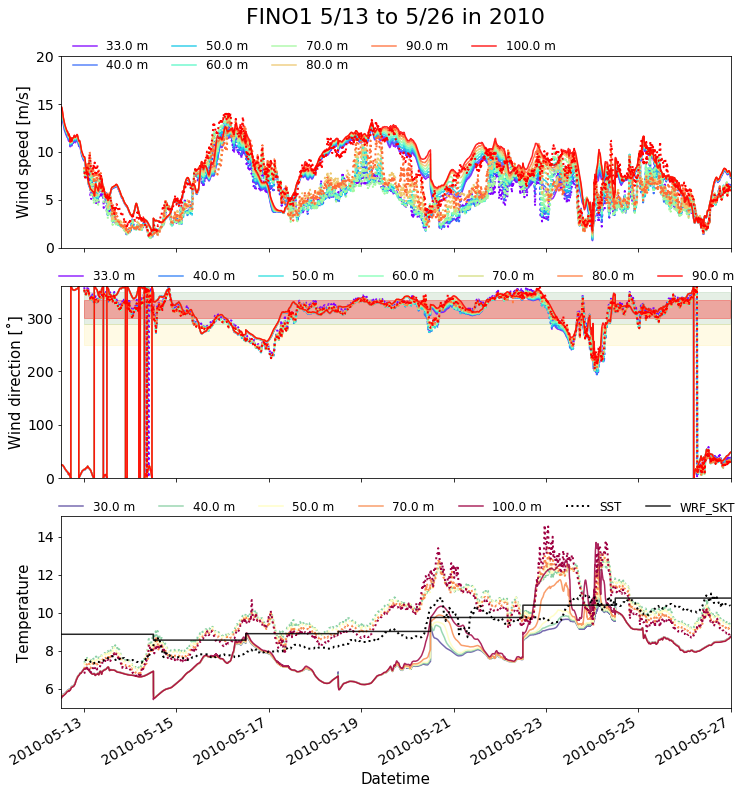

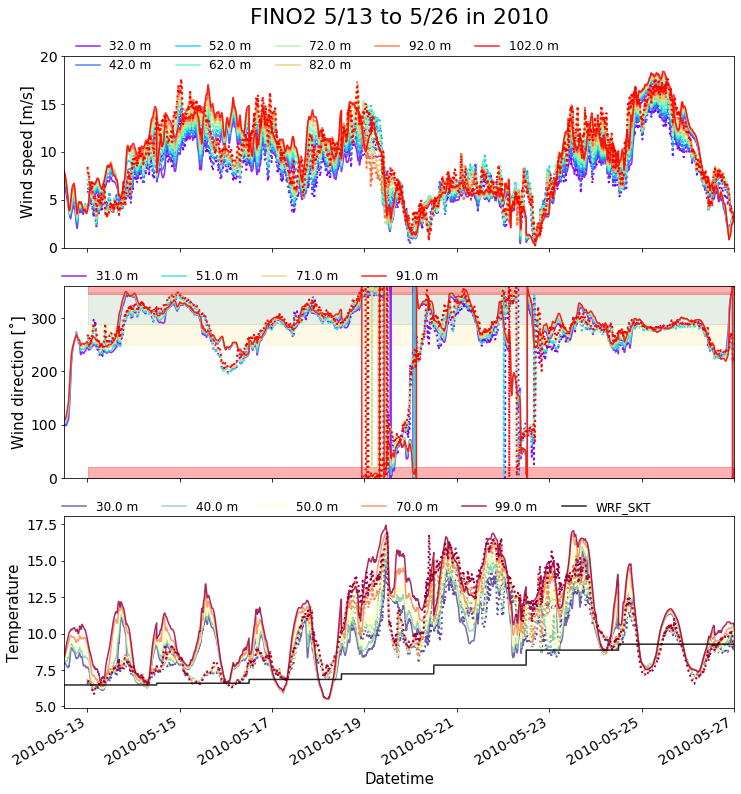

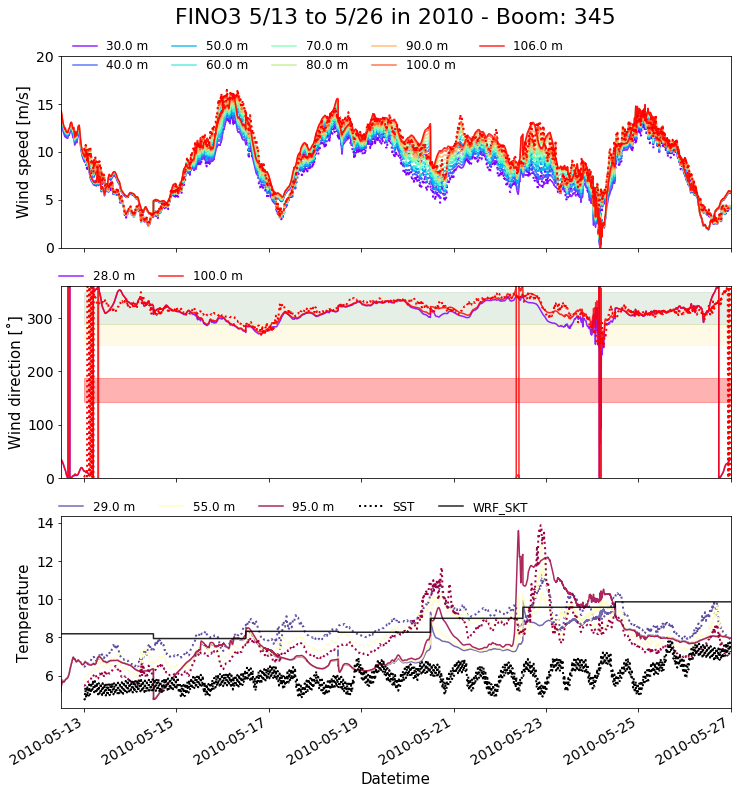

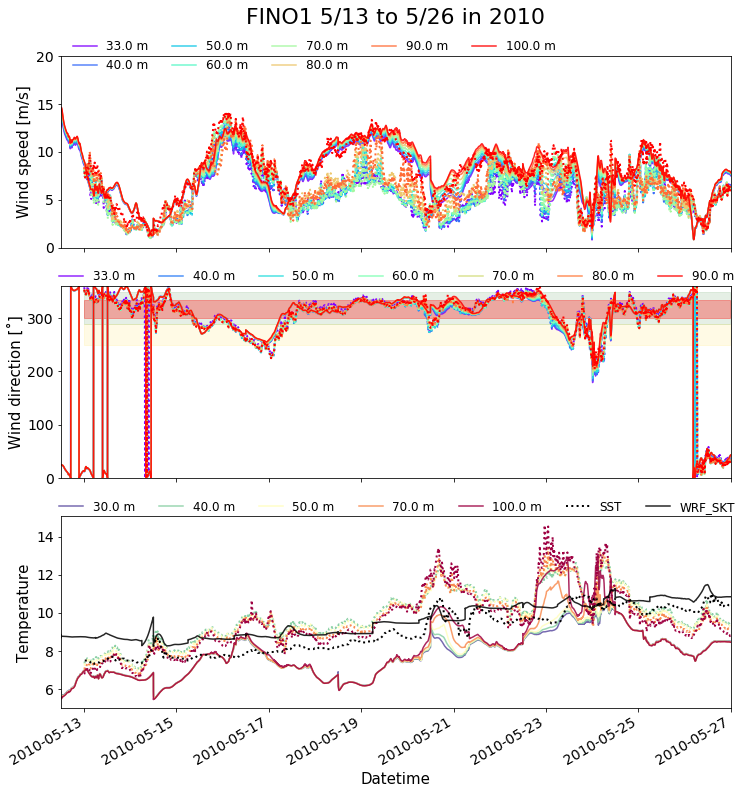

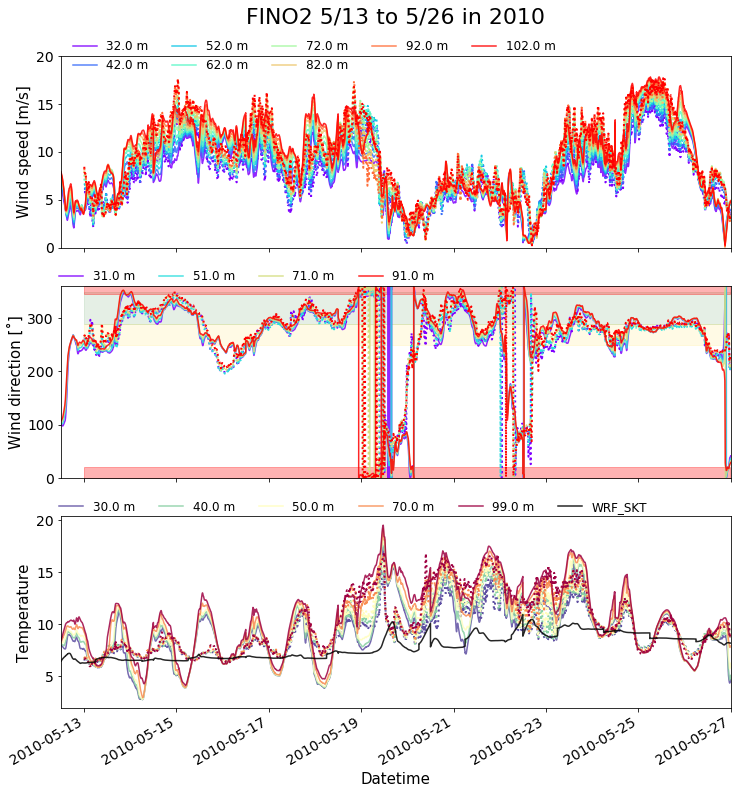

...

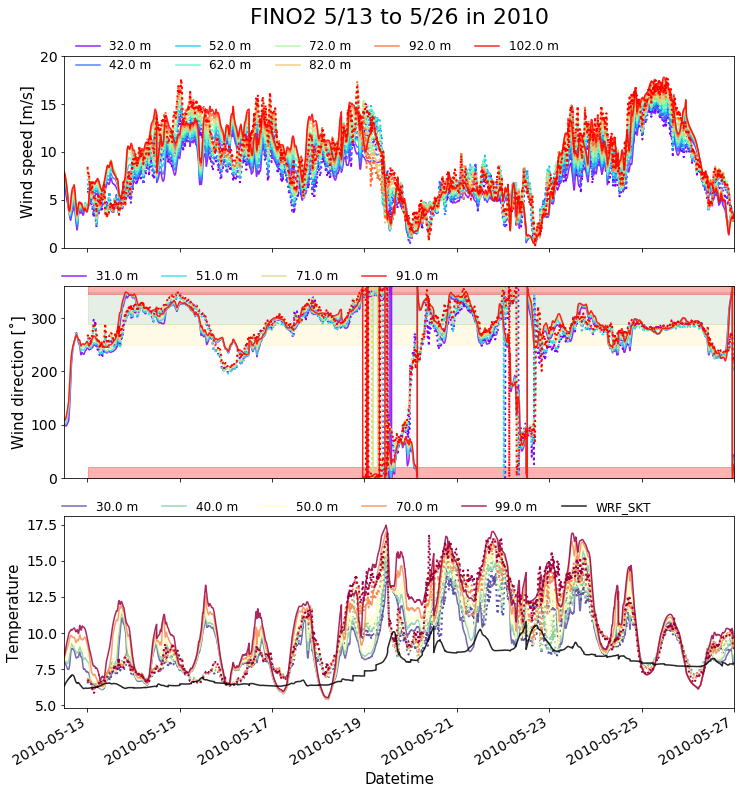

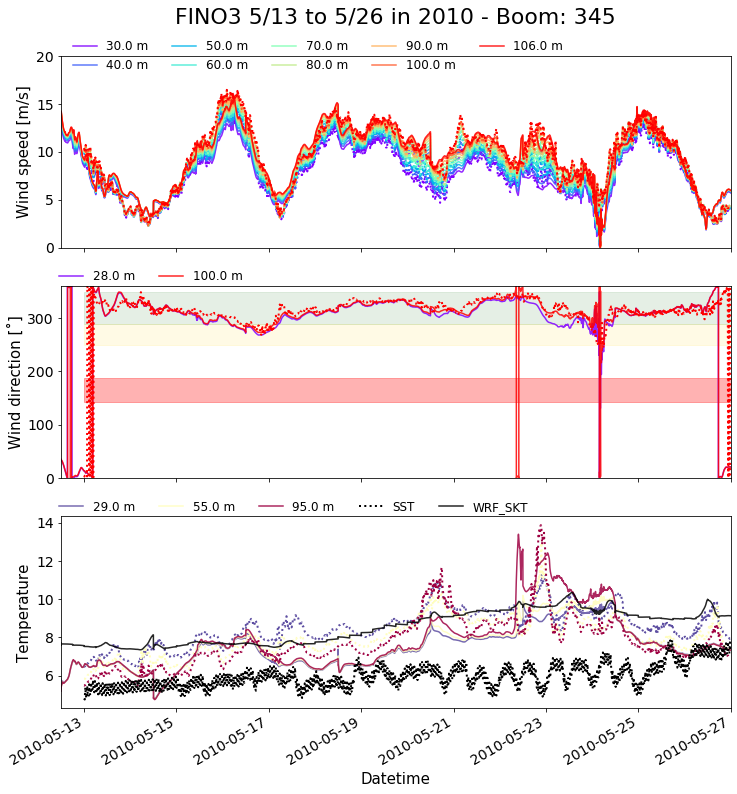

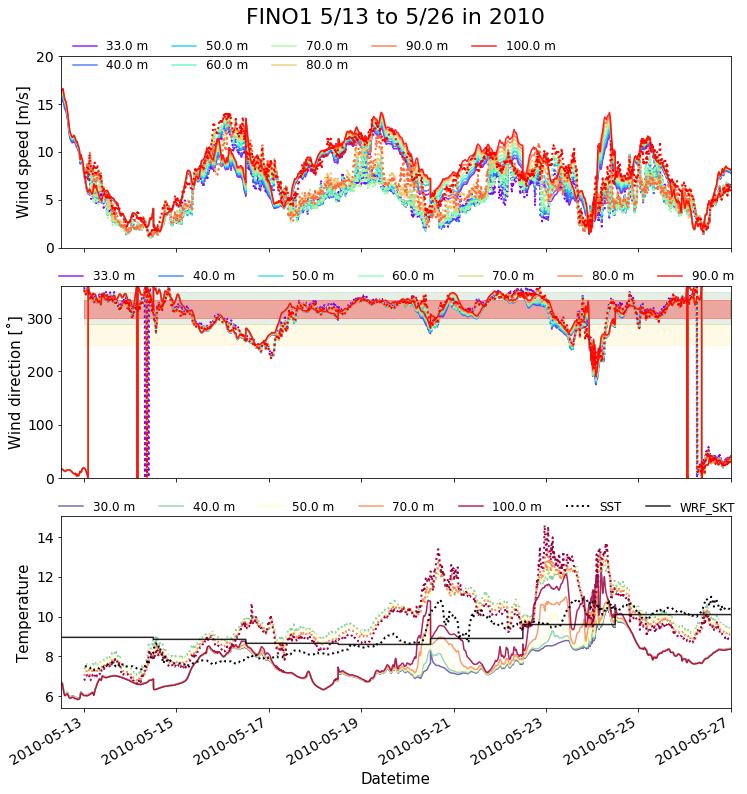

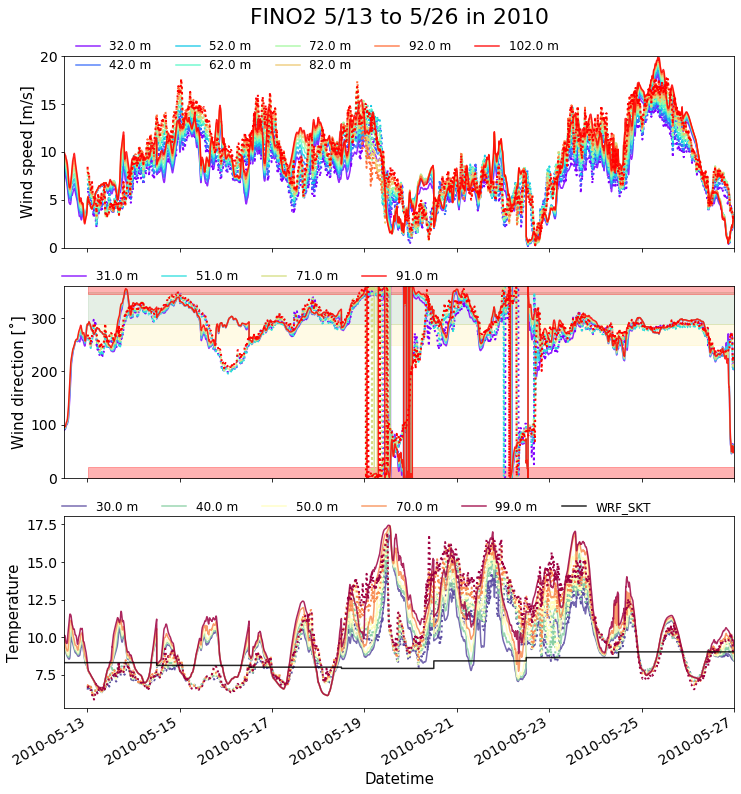

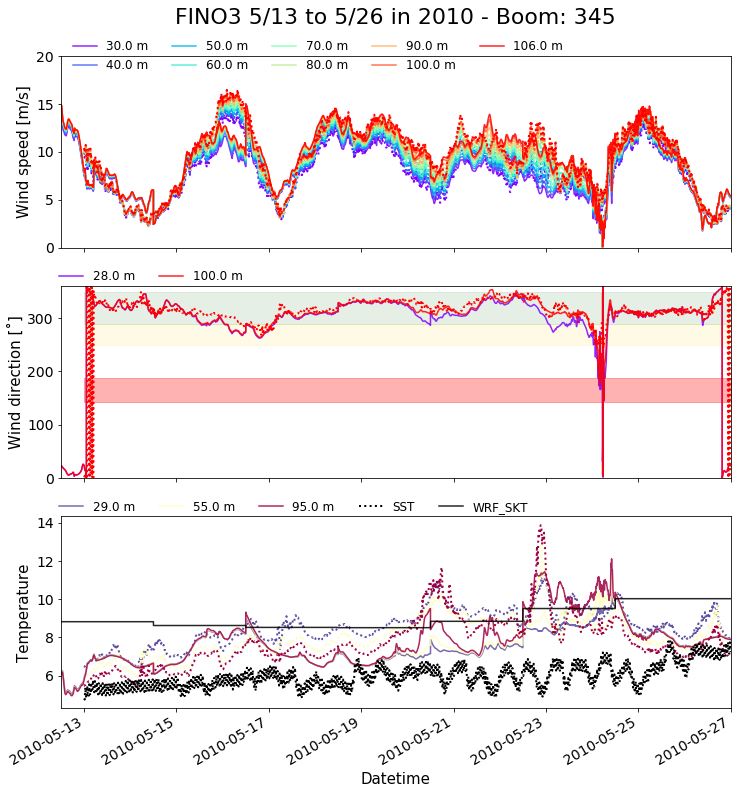

In [12]:
for cc,case in enumerate(cases):
    case_dir = '{}{}/'.format(wrf_dir,case)
    for ff, fino in enumerate([1,2,3]):
        fig,ax = plt.subplots(nrows=3,figsize=(12,12),sharex=True)

        obs_ds = fino_obs['FINO{}'.format(fino)]
        period = obs_ds.sel(datetime=slice(case_days_start[0],case_days_end[0]))
        twr_ds = wrf_twrs[case]['FN{}'.format(fino)]
        height = twr_ds.height.data
        if len(np.shape(height)) > 1:
            levels = height[-1,:,0]
        else:
            levels = height
        #levels = twr_ds.ph.data[0,:,0]
        #levels = twr_ds.height.data
        #print('levels',levels)
        #print('height',height)
        #wefwef

        # ============================================= #
        # ============= WIND SPEED PLOT =============== #
        plt_levels = period.spd_levels.values
        n_plt_lvls = len(plt_levels)

        plt_colors=plt.cm.rainbow(np.linspace(0,1,n_plt_lvls))

        for vv,lvl in enumerate(plt_levels):
            wlvl = np.where(levels==lvl)[0][0]
            wspd_plt = period.wspd.sel(spd_levels=lvl).dropna(how='all',dim='datetime')
            if len(wspd_plt) > 1:
                wspd_plt.plot(ax=ax[0],c=plt_colors[vv],ls=':',lw=2.0)#,label='{0:2.1f} m'.format(lvl))

            wspd_plt = twr_ds.wspd.sel(nz=wlvl)
            if len(wspd_plt) > 1:
                wspd_plt.plot(ax=ax[0],label='{0:2.1f} m'.format(lvl),c=plt_colors[vv],alpha=0.85)
        # ============================================= #
        # ============= WIND DIREC PLOT =============== #
        plt_levels = period.dir_levels.values
        n_plt_lvls = len(plt_levels)

        plt_colors=plt.cm.rainbow(np.linspace(0,1,n_plt_lvls))

        for vv,lvl in enumerate(plt_levels):
            clvl = np.where(plt_levels==lvl)[0][0]
            wlvl = np.where(levels==lvl)[0][0]
            wdir_plt = period.wdir.sel(dir_levels=lvl).dropna(how='all',dim='datetime')
            if len(wdir_plt) > 1:
                wdir_plt.plot(ax=ax[1],c=plt_colors[vv],ls=':',lw=2.0)#,label='{0:2.1f} m'.format(lvl))

            wdir_plt = twr_ds.wdir.sel(nz=wlvl)
            if len(wdir_plt) > 1:
                wdir_plt.plot(ax=ax[1],label='{0:2.1f} m'.format(lvl),c=plt_colors[vv],alpha=0.85)
        # ============================================= #
        # ============= TEMPERATURE PLOT ============== #
        plt_levels = period.tmp_levels.values
        n_plt_lvls = len(plt_levels)


        plt_colors=plt.cm.Spectral_r(np.linspace(0,1,n_plt_lvls))            
        for vv,lvl in enumerate(plt_levels): 
            wlvl = np.where(levels==lvl)[0][0]
            tmp_plt = period.temp.sel(tmp_levels=lvl).dropna(how='all',dim='datetime')
            if len(tmp_plt) > 1:
                tmp_plt.plot(ax=ax[2],c=plt_colors[vv],ls=':',lw=2.0)#,label='{0:2.1f} m'.format(lvl)

            tmp_plt = twr_ds.theta.sel(nz=wlvl)-273.15
            if len(tmp_plt) > 1:
                tmp_plt.plot(ax=ax[2],label='{0:2.1f} m'.format(lvl),c=plt_colors[vv],alpha=0.85)
        sst_data = True
        try:
            sst_plt = period.sst.dropna(dim='datetime',how='any')
        except:
            sst_data = False
        if sst_data:
            if len(sst_plt.values[0]) > 1:
                sst_plt.plot(ax=ax[2],c='k',label='SST',lw=2.0,ls=':')

        (twr_ds.tsk-273.15).plot(c='k',alpha=0.85,label='WRF_SKT')




        # --------- Wind Speed Adjustments ---------- #
        plt_start_date = pd.to_datetime(period.datetime.values[0])
        plt_end_date = pd.to_datetime(period.datetime.values[-1])
        if fino == 3:
            ax[0].set_title('FINO{} {}/{} to {}/{} in {} - Boom: {}'.format(fino,plt_start_date.month,
                                                plt_start_date.day,plt_end_date.month,plt_end_date.day,
                                                plt_end_date.year,boom_deg),size=22,y=1.14)
        else:
            ax[0].set_title('FINO{} {}/{} to {}/{} in {}'.format(fino,plt_start_date.month,plt_start_date.day,
                                                plt_end_date.month,plt_end_date.day,plt_end_date.year),
                                                size=22,y=1.14)
        ax[0].set_xlabel('')
        ax[0].tick_params(labelsize=14)
        ax[0].set_ylabel('Wind speed [m/s]',size=15)
        ax[0].set_ylim(0,20)
        ax[0].set_xlim(period.datetime.values[0],period.datetime.values[-1])
        leg_loc = 0.89
        ax[0].legend(frameon=False,loc=(0.01,leg_loc),ncol=5,fontsize=12)

        # --------- Wind Direction Adjustments --------- #
        ax[1].legend(frameon=False,loc=(-0.01,0.99),ncol=7,fontsize=12)
        ax[1].set_ylim(0,360)
        ax[1].set_xlabel('')
        ax[1].set_xlim(period.datetime.values[0],period.datetime.values[-1])
        ax[1].fill_between([period.datetime.values[0],period.datetime.values[-1]],290,350,color='darkgreen',alpha=0.1)
        ax[1].fill_between([period.datetime.values[0],period.datetime.values[-1]],250,290,color='gold',alpha=0.1)
        ax[1].set_title('')
        ax[1].tick_params(labelsize=14)
        ax[1].set_ylabel('Wind direction [˚]',size=15)
        if fino == 2: 
            ax[1].fill_between([period.datetime.values[0],period.datetime.values[-1]],
                               wake_degs['FINO{}'.format(fino)][0],360,color='red',alpha=0.3)
            ax[1].fill_between([period.datetime.values[0],period.datetime.values[-1]],
                               0.0,wake_degs['FINO{}'.format(fino)][1],color='red',alpha=0.3)
        else:
            ax[1].fill_between([period.datetime.values[0],period.datetime.values[-1]],
                               wake_degs['FINO{}'.format(fino)][0],wake_degs['FINO{}'.format(fino)][1],
                               color='red',alpha=0.3)

        # --------- Temperature Adjustments --------- #
        #ax[2].set_ylim(0,360)
        ax[2].set_xlim(twr_ds.datetime.values[0],twr_ds.datetime.values[-1])
        ax[2].set_title('')
        ax[2].tick_params(labelsize=14)
        ax[2].set_ylabel('Temperature',size=15)
        ax[2].set_xlabel('Datetime',size=15)
        ax[2].legend(frameon=False,loc=(-0.01,0.99),ncol=7,fontsize=12)
        # -------------------------------------------- #

        # Save the figures:
        if fino==3:
            savestr = '{}img/case_day_{}_FINO{}_boomdeg{}.png'.format(case_dir,case_days_start[0],fino,boom_deg)
        else:
            savestr = '{}img/case_day_{}_FINO{}.png'.format(case_dir,case_days_start[0],fino)
        if save_figs: plt.savefig(savestr)

        plt.show()
        print('\n\n\n\n')

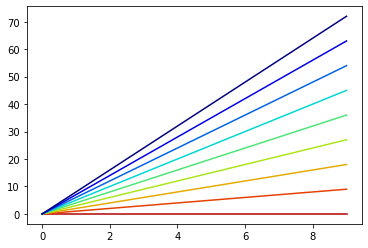

In [12]:
case_colors = {}
for ss,stn in enumerate(cases):
    #line_cols = plt.cm.gist_rainbow_r(np.linspace(0.15,1.0,len(cases)))[ss]
    line_cols = plt.cm.jet_r(np.linspace(0.07,0.98,len(cases)))[ss]
    darken = 0.1
    for tt,col in enumerate(line_cols):
        if tt < 3:
            line_cols[tt] = col - darken
            if line_cols[tt] < 0.0: line_cols[tt] = 0.0
    case_colors[stn] = line_cols
for ss,stn in enumerate(cases):
    plt.plot(np.arange(0,10),np.arange(0,10)*ss,c=case_colors[stn])

### Check SST Differences

/glade/u/home/hawbecke/local/envs/mmc/lib/python3.7/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


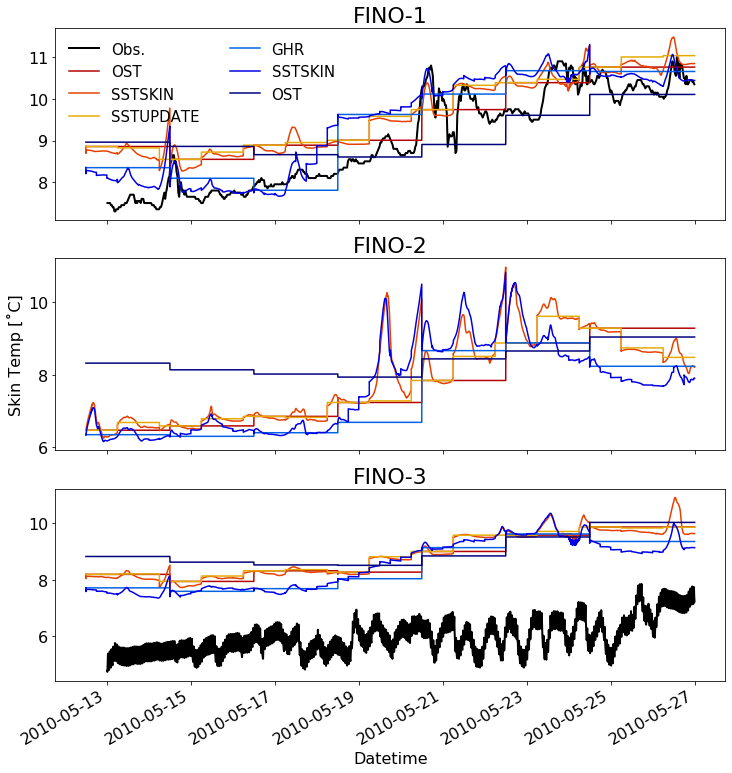

In [13]:
sst_cases = ['ERAI_YSU_KF_CHRN_OST','ERAI_YSU_KF_CHRN_OST_SSTSKIN','ERAI_YSU_KF_CHRN_OST_SSTUPDATE',
             'ERAI_YSU_KF_CHRN_GHR','ERAI_YSU_KF_CHRN_GHR_SSTSKIN','GFS_YSU_KF_CHRN_OST']
case_c = ['k','g','r','b']
twr_st = ['-',':','--','-.']
fig,ax = plt.subplots(nrows=3,figsize=(12,12),sharex=True)
for cc,case in enumerate(sst_cases):
    case_dir = '{}{}/'.format(wrf_dir,case)
    for ff, fino in enumerate([1,2,3]):
        if cc == 0:
            obs_ds = fino_obs['FINO{}'.format(fino)]
            period = obs_ds.sel(datetime=slice(case_days_start[0],case_days_end[0]))
            sst_data = True
            try:
                sst_plt = period.sst.dropna(dim='datetime',how='any')
            except:
                sst_data = False
            if sst_data:
                if len(sst_plt.values[0]) > 1:
                    sst_plt.plot(ax=ax[ff],c='k',label='Obs.',lw=2.0)#,ls=twr_st[ff])
                    

        twr_ds = wrf_twrs[case]['FN{}'.format(fino)]
        (twr_ds.tsk-273.15).plot(ax=ax[ff],c=case_colors[case],label='{}'.format(case.split('_')[-1]))#,ls=twr_st[ff])

for ff, fino in enumerate([1,2,3]):
    ax[ff].set_title('FINO-{}'.format(fino),size=22)
    ax[ff].tick_params(labelsize=16)
    if fino == 3: 
        ax[ff].set_xlabel('Datetime',size=16)
    else:
        ax[ff].set_xlabel('')
    if fino == 2:
        ax[ff].set_ylabel('Skin Temp [˚C]',size=16)
    else:
        ax[ff].set_ylabel('')

ax[0].legend(frameon=False,fontsize=15,ncol=2)
plt.show()

In [14]:
remove_mean  = False
remove_wake  = True
replace_wake = True

# Wind Speed Taylor Diagrams

In [15]:
t_s = wrf_twrs[cases[0]]['FN1'].datetime.data[0] + pd.to_timedelta(12,'h') # Account for spinup
t_e = wrf_twrs[cases[0]]['FN1'].datetime.data[-1]

In [34]:
fino_obs['FINO2']

<xarray.Dataset>
Dimensions:     (anm_levels: 3, datetime: 52559, dir_levels: 4, pcp_levels: 1, prs_levels: 2, rad_levels: 1, rh_levels: 3, spd_levels: 8, tmp_levels: 5)
Coordinates:
  * rh_levels   (rh_levels) float64 30.0 50.0 99.0
  * prs_levels  (prs_levels) float64 30.0 90.0
  * anm_levels  (anm_levels) float64 42.0 62.0 82.0
  * tmp_levels  (tmp_levels) float64 30.0 40.0 50.0 70.0 99.0
  * dir_levels  (dir_levels) float64 31.0 51.0 71.0 91.0
  * spd_levels  (spd_levels) float64 32.0 42.0 52.0 62.0 72.0 82.0 92.0 102.0
  * datetime    (datetime) datetime64[ns] 2010-01-01T00:15:00 ... 2010-12-31T23:55:00
  * rad_levels  (rad_levels) float64 60.0
  * pcp_levels  (pcp_levels) float64 60.0
Data variables:
    wspd        (spd_levels, datetime) float64 4.82 6.13 7.6 ... 22.49 21.72
    wdir        (dir_levels, datetime) float64 67.0 59.0 54.0 ... 258.0 259.0
    temp        (tmp_levels, datetime) float64 0.07 0.12 -0.17 ... 1.98 1.81 1.8
    anm_spd     (anm_levels, datetime) float64 4.73 5.89 7.24 ... 21.75 21.05
    anm_dir     (anm_levels, datetime) float64 62.0 54.0 50.0 ... nan nan nan
    pres        (prs_levels, datetime) float64 997.8 997.6 997.5 ... 993.2 993.0
    rh          (rh_levels, datetime) float64 76.11 78.54 85.19 ... 91.53 92.8
    rad         (rad_levels, datetime) float64 0.6 0.6 0.29 ... 0.92 0.62 0.62
    prcp        (pcp_levels, datetime) float64 0.0 0.0 0.0 0.0 ... 0.0 0.0 0.0

In [39]:
len(obs_ds.anm_spd.sel(datetime=slice(t_s,t_e),anm_levels=lvl).dropna(
                                how='all',dim='datetime'))#.resample(
                                #datetime='10min').interpolate('linear')

0

In [ ]:
obs_ds.anm_spd.sel(datetime=slice(t_s,t_e),anm_levels=lvl)

In [48]:
def remove_or_replace_wake(ds,lvl,start=None,end=None,remove_wake=True,replace_wake=True,wake_deg_bot=None,wake_deg_top=None):

    obs_wdir = ds.wdir.sel(datetime=slice(start,end),dir_levels=dir_lvl).dropna(
                                    how='all',dim='datetime').resample(datetime='10min').nearest()
    wake_spd = ds.wspd.sel(datetime=slice(start,end),spd_levels=lvl).dropna(
                                    how='all',dim='datetime').resample(
                                    datetime='10min').interpolate('linear').copy()    
    if remove_wake:
        if fino == 2:
            wake_spd[np.where((obs_wdir.data >= wake_deg_bot) | \
                              (obs_wdir.data <= wake_deg_top))] = np.nan
        else:
            wake_spd[np.where((obs_wdir.data >= wake_deg_bot) & \
                              (obs_wdir.data <= wake_deg_top))] = np.nan


    if replace_wake:
        if lvl in ds.anm_levels:
            anem_spd = ds.anm_spd.sel(datetime=slice(start,end),anm_levels=lvl).dropna(
                                            how='all',dim='datetime')
            if len(anem_spd) > 1:
                good_to_replace = True
                anem_spd = anem_spd.resample(datetime='10min').interpolate('linear')
            else:
                good_to_replace = False

            if good_to_replace:
                if fino == 2:
                    inds_of_interest = np.where((obs_wdir.data >= wake_degs['FINO{}'.format(fino)][0]) | \
                                      (obs_wdir.data <= wake_degs['FINO{}'.format(fino)][1]))
                else:
                    inds_of_interest = np.where((obs_wdir.data >= wake_degs['FINO{}'.format(fino)][0]) & \
                                      (obs_wdir.data <= wake_degs['FINO{}'.format(fino)][1]))
                wake_spd[inds_of_interest] = anem_spd.data[inds_of_interest]
            else:
                print('Unable to replace height {} for FINO-{} due to missing data'.format(lvl,fino))
    return wake_spd

/glade/scratch/hawbecke/WRF/MMC/FINO1/20100512_to_20100526//img/TD_data_FINO1_nowake


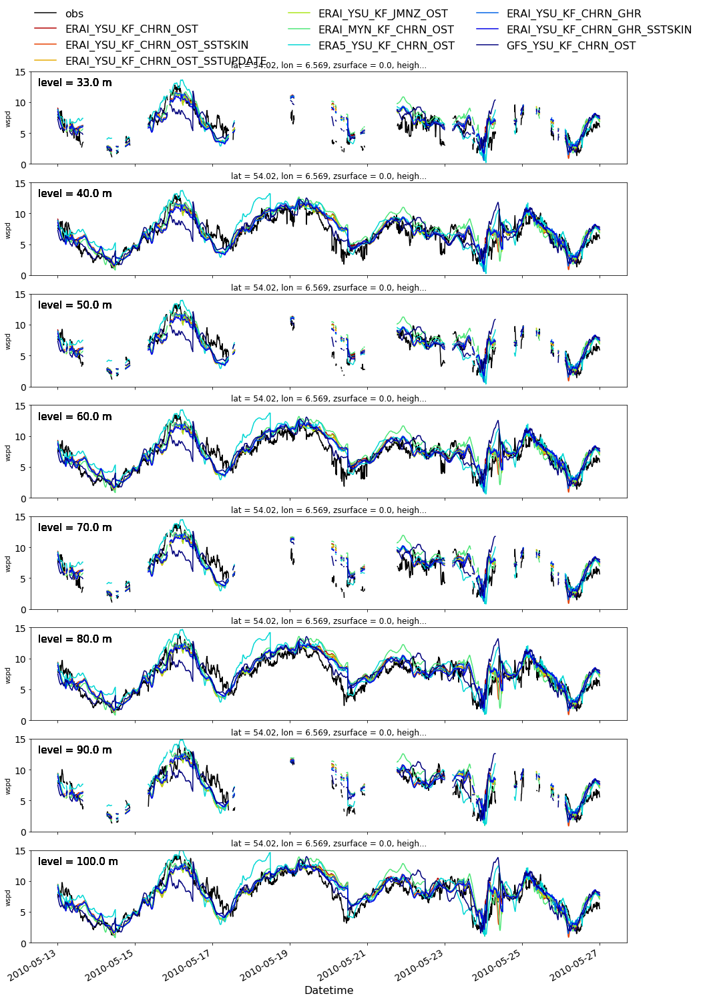

/glade/scratch/hawbecke/WRF/MMC/FINO1/20100512_to_20100526//img/TD_FINO1_nowake


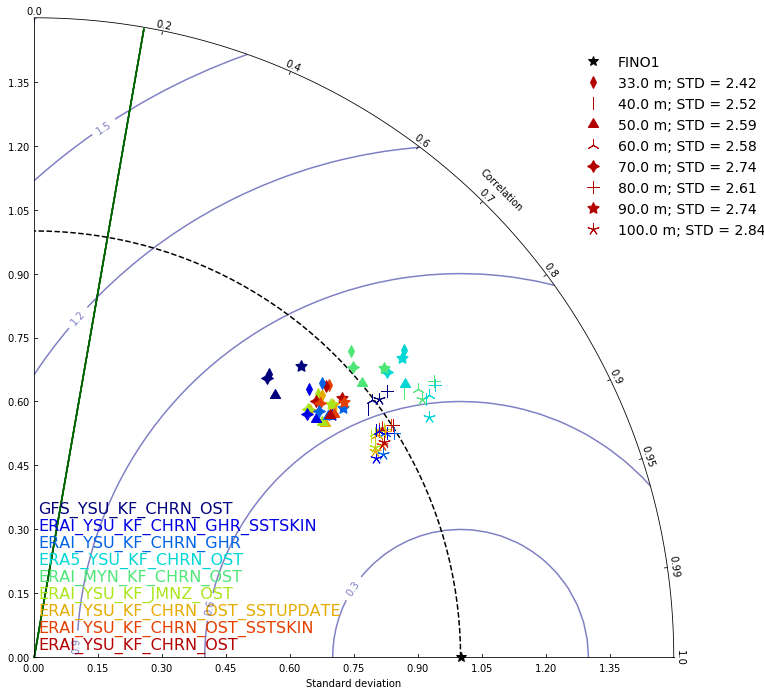

Unable to replace height 62.0 for FINO-2 due to missing data
Unable to replace height 82.0 for FINO-2 due to missing data
/glade/scratch/hawbecke/WRF/MMC/FINO1/20100512_to_20100526//img/TD_data_FINO2_nowake


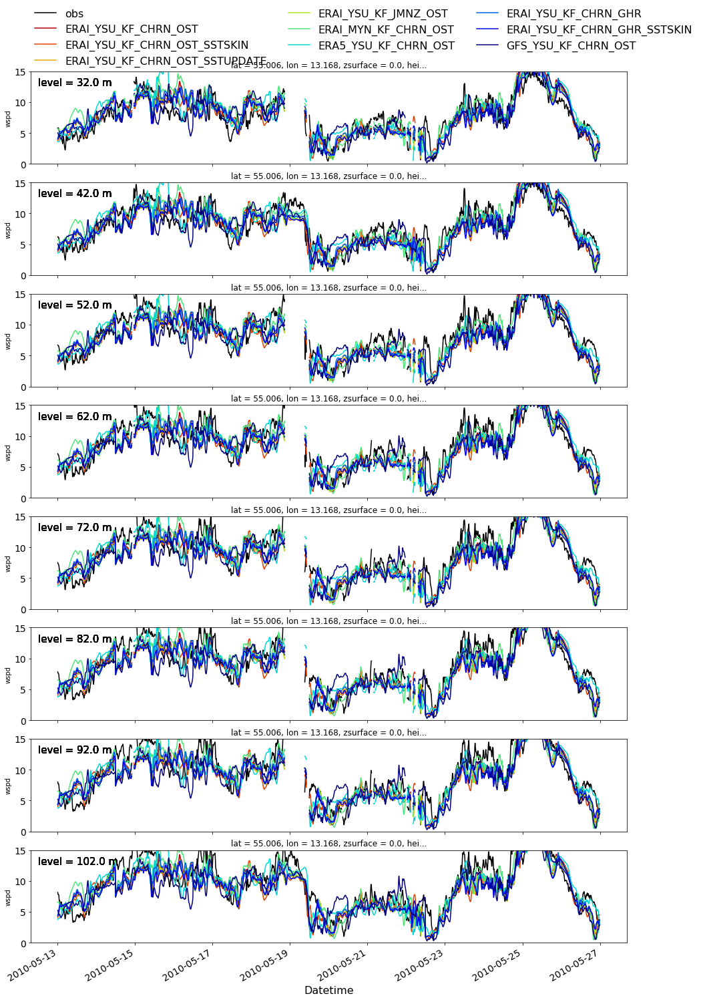

/glade/scratch/hawbecke/WRF/MMC/FINO1/20100512_to_20100526//img/TD_FINO2_nowake


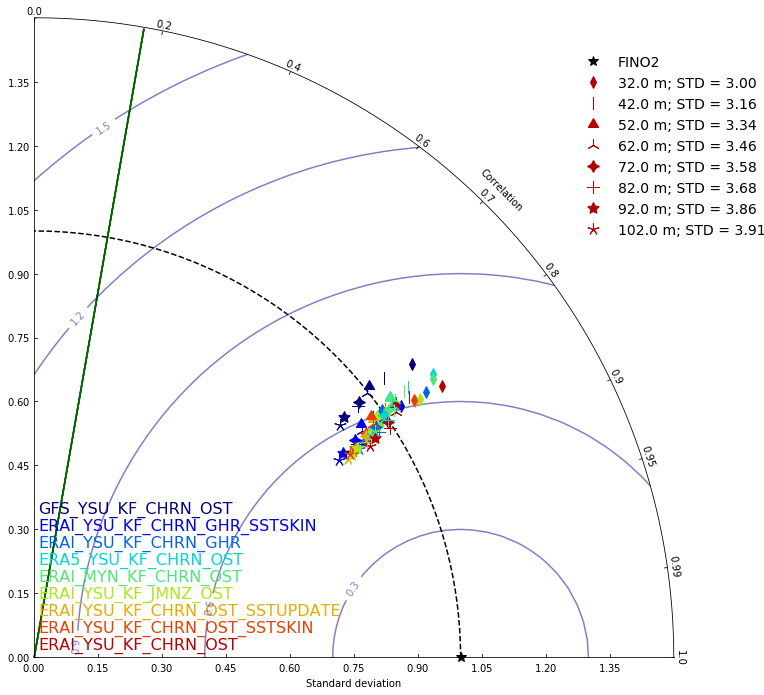

/glade/scratch/hawbecke/WRF/MMC/FINO1/20100512_to_20100526//img/TD_data_FINO3_nowake


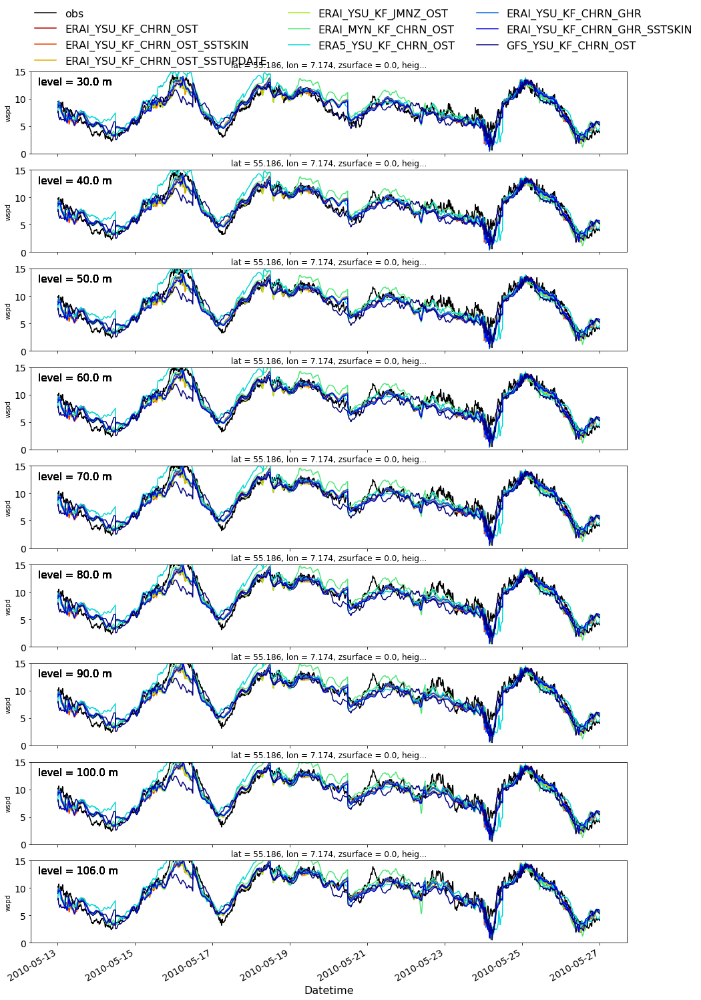

/glade/scratch/hawbecke/WRF/MMC/FINO1/20100512_to_20100526//img/TD_FINO3_nowake


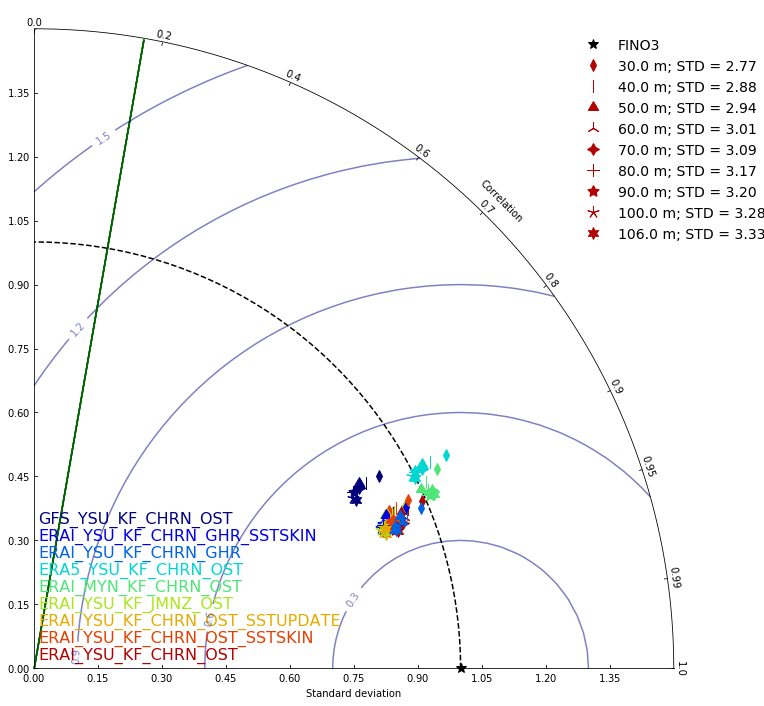

In [57]:
remove_mean  = False
remove_wake  = True
replace_wake = True
for ff, fino in enumerate([1,2,3]):
    obs_ds = fino_obs['FINO{}'.format(fino)]
    levels = obs_ds.spd_levels.values
    obs_wdir = obs_ds.wdir
    max_pts = 0
    dir_lvl = 0
    for vv,lvl in enumerate(obs_wdir.dir_levels.values):
        dir_lvl = obs_wdir.sel(dir_levels=lvl).dropna(how='all',dim='datetime')
        num_pts = len(dir_lvl)
        if num_pts > max_pts:
            dir_lvl = lvl
    
    tay_obs_levels = [[[]]*len(levels)][0]
    ref_std_levels = np.zeros((ncases,len(levels)))
    sim_std_levels = np.zeros((ncases,len(levels)))
    sim_cor_levels = np.zeros((ncases,len(levels)))
    fig,ax = plt.subplots(nrows=len(levels),figsize=(16,24),sharex=True)
    for cc,case in enumerate(cases):
        twr_ds = wrf_twrs[case]['FN{}'.format(fino)].sel(station='FN{}'.format(fino))
        tay_wrf_levels = [[[]]*len(levels)][0]

        for vv,lvl in enumerate(levels):
            if cc == 0:

                
                
                remove = (remove_wake and lvl < 100.0)
                replace = (replace_wake and (fino == 1 or fino == 2))

                tay_obs_levels[vv] = remove_or_replace_wake(obs_ds,lvl,start=t_s,end=t_e,remove_wake=remove,
                                                            replace_wake=(replace and (fino == 1 or fino == 2)),
                                                            wake_deg_bot=wake_degs['FINO{}'.format(fino)][0],
                                                            wake_deg_top=wake_degs['FINO{}'.format(fino)][1])
                
                '''
                tay_obs_levels[vv] = obs_ds.wspd.sel(datetime=slice(t_s,t_e),spd_levels=lvl).dropna(
                                                    how='all',dim='datetime').resample(
                                                    datetime='10min').interpolate('linear')                
                if remove_wake:
                    obs_wdir = obs_ds.wdir.sel(datetime=slice(t_s,t_e),dir_levels=dir_lvl).dropna(
                                                    how='all',dim='datetime').resample(datetime='10min').nearest()
                    wake_spd = tay_obs_levels[vv].copy()
                    if fino == 2:
                        wake_spd[np.where((obs_wdir.data >= wake_degs['FINO{}'.format(fino)][0]) | \
                                          (obs_wdir.data <= wake_degs['FINO{}'.format(fino)][1]))] = np.nan
                    else:
                        wake_spd[np.where((obs_wdir.data >= wake_degs['FINO{}'.format(fino)][0]) & \
                                          (obs_wdir.data <= wake_degs['FINO{}'.format(fino)][1]))] = np.nan
                    tay_obs_levels[vv] = wake_spd

                    
                if replace_wake and (fino == 1 or fino == 2):
                    if lvl in obs_ds.anm_levels:
                        obs_wdir = obs_ds.wdir.sel(datetime=slice(t_s,t_e),dir_levels=dir_lvl).dropna(
                                                        how='all',dim='datetime').resample(datetime='10min').nearest()
                        wake_spd = tay_obs_levels[vv].copy()
                        anem_spd = obs_ds.anm_spd.sel(datetime=slice(t_s,t_e),anm_levels=lvl).dropna(
                                                        how='all',dim='datetime')
                        if len(anem_spd) > 1:
                            good_to_replace = True
                            anem_spd = anem_spd.resample(datetime='10min').interpolate('linear')
                        else:
                            good_to_replace = False
                            
                        if good_to_replace:
                            if fino == 2:
                                inds_of_interest = np.where((obs_wdir.data >= wake_degs['FINO{}'.format(fino)][0]) | \
                                                  (obs_wdir.data <= wake_degs['FINO{}'.format(fino)][1]))
                            else:
                                inds_of_interest = np.where((obs_wdir.data >= wake_degs['FINO{}'.format(fino)][0]) & \
                                                  (obs_wdir.data <= wake_degs['FINO{}'.format(fino)][1]))
                            wake_spd[inds_of_interest] = anem_spd.data[inds_of_interest]
                            tay_obs_levels[vv] = wake_spd
                        else:
                            print('Unable to replace height {} for FINO-{} due to missing data'.format(lvl,fino))
                    '''
            
            # - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - #
            # - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - #            
            ### THIS SHOULD NOT BE A MEAN!!        
            tay_wrf_levels[vv] = twr_ds.wspd.sel(datetime=slice(t_s,t_e),nz=vv).dropna(
                                                how='all',dim='datetime').resample(datetime='10min').mean()
            # - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - #
            # - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - - #

            ax[vv].text(twr_ds.datetime.values[0],14.0,'level = {} m'.format(lvl),va='top',size=15)
            
            if remove_wake:
                wake_spd = tay_wrf_levels[vv].copy()
                wake_spd[np.where(np.isnan(tay_obs_levels[vv]))] = np.nan
                tay_wrf_levels[vv] = wake_spd

            obs = tay_obs_levels[vv]
            sim = tay_wrf_levels[vv]

            sim[np.where(np.isnan(obs))] = np.nan

            obs = obs.dropna(dim='datetime',how='all')
            sim = sim.dropna(dim='datetime',how='all')
            if remove_mean:
                obs = obs - lowess_mean(obs,2016/32,0)
                sim = sim - lowess_mean(sim,2016/32,0)
                
            
            if len(obs) != len(sim):
                sim = sim.sel(datetime=slice(obs.datetime[0],obs.datetime[-1]))
            if cc == 0: 
                obs.resample(datetime='10min').asfreq().plot(ax=ax[vv],c='k',label='obs')
            sim.resample(datetime='10min').asfreq().plot(ax=ax[vv],c=case_colors[case],label=case)
            ax[vv].tick_params(labelsize=14)
            if vv == len(levels)-1:
                ax[vv].set_xlabel('Datetime',size=16)
            else:
                ax[vv].set_xlabel('')
            if remove_mean: ax[vv].set_ylim(-5,5)


            ref_std_levels[cc,vv] = np.std(obs.data)
            sim_std_levels[cc,vv] = np.std(sim.data)
            sim_cor_levels[cc,vv] = np.corrcoef(sim,obs)[0,1]
            ax[vv].set_ylim(0,15)
    ax[0].legend(frameon=False,loc=(0.0,1.0),ncol=3,fontsize=16)
    save_str = '{}/img/TD_data_FINO{}'.format(wrf_dir,fino)
    if remove_mean: save_str += '_pert'
    if remove_wake: save_str += '_nowake'
    print(save_str)
    if save_figs: plt.savefig('{}.png'.format(save_str))
    plt.show()
    
    


    fig_tay = plt.figure(figsize=(12,12))    
    dia = TaylorDiagram(1.0, fig=fig_tay, extend=False,
                            label='FINO{}'.format(fino))
    for cc,case in enumerate(cases):
        twr_dict = {}
        for a,b,c,d in zip(range(0,len(levels)),sim_std_levels[cc,:]/ref_std_levels[cc,:],
                           sim_cor_levels[cc,:],levels):
            twr_dict[a] = [b,c,'{} m'.format(d)]



        x95 = [0.0, 0.89*(np.pi/2)]
        y95 = [0.0, 1.495]

        dia.ax.plot(x95,y95,color='darkgreen',alpha=0.5)
        markers = [(i,j,0) for i in range(2,len(levels)+2) for j in range(1, 3)]

        for ii,item in enumerate(twr_dict):
            point = twr_dict[item]
            if cc == 0:
                pt_label = '{0}; STD = {1:1.2f}'.format(point[2],ref_std_levels[cc,ii])
            else:
                pt_label = None
            dia.add_sample(point[0], point[1],
                           marker=markers[item], ms=12, ls='',
                           mfc=case_colors[case], mec=case_colors[case], # Colors
                           label=pt_label,
                           zorder=4)
        plt.text(0.01,0.01+0.04*cc,case,color=case_colors[case],ha='left',va='bottom',size=16)

    contours = dia.add_contours(levels=5, colors='darkblue',alpha=0.5)
    dia.ax.clabel(contours, inline=1, fontsize=10, fmt='%.1f')
    fig_tay.legend(frameon=False,loc=(0.75,0.65),fontsize=14)
    save_str = '{}/img/TD_FINO{}'.format(wrf_dir,fino)
    if remove_mean: save_str += '_pert'
    if remove_wake: save_str += '_nowake'
    print(save_str)
    if save_figs: plt.savefig('{}.png'.format(save_str))
    plt.show()
    
    
    

# Temperature TDs

In [43]:
remove_wake = False

for ff, fino in enumerate([1,2,3]):
    obs_ds = fino_obs['FINO{}'.format(fino)]
    levels = obs_ds.tmp_levels.values
    obs_wdir = obs_ds.wdir
    max_pts = 0
    dir_lvl = 0
    for vv,lvl in enumerate(obs_wdir.dir_levels.values):
        dir_lvl = obs_wdir.sel(dir_levels=lvl).dropna(how='all',dim='datetime')
        num_pts = len(dir_lvl)
        if num_pts > max_pts:
            dir_lvl = lvl
    good_lvls = []
    for vv,lvl in enumerate(levels):
        if len(obs_ds.temp.sel(datetime=slice(case_days_start[0],case_days_end[0]),
                               tmp_levels=lvl).dropna(how='all',dim='datetime')) > 1:
            good_lvls.append(lvl)
    levels = good_lvls

    tay_obs_levels = [[[]]*len(levels)][0]
    ref_std_levels = np.zeros((ncases,len(levels)))
    sim_std_levels = np.zeros((ncases,len(levels)))
    sim_cor_levels = np.zeros((ncases,len(levels)))
    fig,ax = plt.subplots(nrows=len(levels),figsize=(16,24),sharex=True)
    for cc,case in enumerate(cases):
        twr_ds = wrf_twrs[case]['FN{}'.format(fino)].sel(station='FN{}'.format(fino))
        tay_wrf_levels = [[[]]*len(levels)][0]
        twr_ds['T'] = theta_to_T(twr_ds.theta,twr_ds.pr/100.0) - 273.15
        for vv,lvl in enumerate(levels):
            if cc == 0:
                tay_obs_levels[vv] = obs_ds.temp.sel(datetime=slice(case_days_start[0],case_days_end[0]),
                                                     tmp_levels=lvl).dropna(how='all',dim='datetime').resample(
                                                     datetime='10min').interpolate('linear')

                if remove_wake:
                    obs_wdir = obs_ds.wdir.sel(datetime=slice(case_days_start[0],case_days_end[0]),
                                               dir_levels=dir_lvl).dropna(how='all',dim='datetime').resample(
                                               datetime='10min').nearest()
                    wake_tmp = tay_obs_levels[vv].copy()
                    if fino == 2:
                        wake_tmp[np.where((obs_wdir.data >= wake_degs['FINO{}'.format(fino)][0]) | \
                                          (obs_wdir.data <= wake_degs['FINO{}'.format(fino)][1]))] = np.nan
                    else:
                        wake_tmp[np.where((obs_wdir.data >= wake_degs['FINO{}'.format(fino)][0]) & \
                                          (obs_wdir.data <= wake_degs['FINO{}'.format(fino)][1]))] = np.nan
                    tay_obs_levels[vv] = wake_tmp

            tay_wrf_levels[vv] = twr_ds.T.sel(datetime=slice(case_days_start[0],case_days_end[0]),nz=vv).dropna(
                                                how='all',dim='datetime').resample(datetime='10min').mean()
            if remove_wake:
                wake_tmp = tay_wrf_levels[vv].copy()
                wake_tmp[np.where(np.isnan(tay_obs_levels[vv]))] = np.nan
                tay_wrf_levels[vv] = wake_tmp

            obs = tay_obs_levels[vv]
            sim = tay_wrf_levels[vv]

            sim[np.where(np.isnan(obs))] = np.nan

            obs = obs.dropna(dim='datetime',how='all')
            sim = sim.dropna(dim='datetime',how='all')

            if remove_mean:
                obs = obs - lowess_mean(obs,2016/32,0)
                sim = sim - lowess_mean(sim,2016/32,0)

            if cc == 0: 
                obs.resample(datetime='10min').asfreq().plot(ax=ax[vv],c='k',label='obs')
            sim.resample(datetime='10min').asfreq().plot(ax=ax[vv],c=case_colors[case],label=case)
            ax[vv].tick_params(labelsize=14)
            if vv == len(levels)-1:
                ax[vv].set_xlabel('Datetime',size=16)
            else:
                ax[vv].set_xlabel('')
            if remove_mean: ax[vv].set_ylim(-5,5)
            if len(obs) != len(sim):
                sim = sim.sel(datetime=slice(obs.datetime[0],obs.datetime[-1]))
            ref_std_levels[cc,vv] = np.std(obs.data)
            sim_std_levels[cc,vv] = np.std(sim.data)
            sim_cor_levels[cc,vv] = np.corrcoef(sim,obs)[0,1]
    ax[0].legend(frameon=False,loc=(0.0,1.0),ncol=3,fontsize=16)
    save_str = '{}/img/TD_data_FINO{}_T'.format(wrf_dir,fino)
    if remove_mean: save_str += '_pert'
    if remove_wake: save_str += '_nowake'
    print(save_str)
    if save_figs: plt.savefig('{}.png'.format(save_str))
    plt.show()
    


    fig_tay = plt.figure(figsize=(16,16))    
    dia = TaylorDiagram(1.0, fig=fig_tay, extend=False,
                            label='FINO{}'.format(fino))
    for cc,case in enumerate(cases):
        twr_dict = {}
        for a,b,c,d in zip(range(0,len(levels)),sim_std_levels[cc,:]/ref_std_levels[cc,:],
                           sim_cor_levels[cc,:],levels):
            twr_dict[a] = [b,c,'{} m'.format(d)]



        x95 = [0.0, 0.89*(np.pi/2)]
        y95 = [0.0, 1.495]

        dia.ax.plot(x95,y95,color='darkgreen',alpha=0.5)
        markers = [(i,j,0) for i in range(2,len(levels)+2) for j in range(1, 3)]

        for ii,item in enumerate(twr_dict):
            point = twr_dict[item]
            if cc == 0:
                pt_label = '{0}; STD = {1:1.2f}'.format(point[2],ref_std_levels[cc,ii])
            else:
                pt_label = None
            dia.add_sample(point[0], point[1],
                           marker=markers[item], ms=12, ls='',
                           mfc=case_colors[case], mec=case_colors[case], # Colors
                           label=pt_label,
                           zorder=4)
        plt.text(0.01,0.01+0.04*cc,case,color=case_colors[case],ha='left',va='bottom',size=16)

    contours = dia.add_contours(levels=5, colors='darkblue',alpha=0.5)
    dia.ax.clabel(contours, inline=1, fontsize=10, fmt='%.1f')
    fig_tay.legend(frameon=False,loc=(0.75,0.65),fontsize=14)
    save_str = '{}/img/TD_FINO{}_T'.format(wrf_dir,fino)
    if remove_mean: save_str += '_pert'
    if remove_wake: save_str += '_nowake'
    print(save_str)
    if save_figs: plt.savefig('{}.png'.format(save_str))
    plt.show()
    
    

# Subset of period TDs

/glade/scratch/hawbecke/WRF/MMC/FINO1/20100512_to_20100526//img/TD_data_FINO1


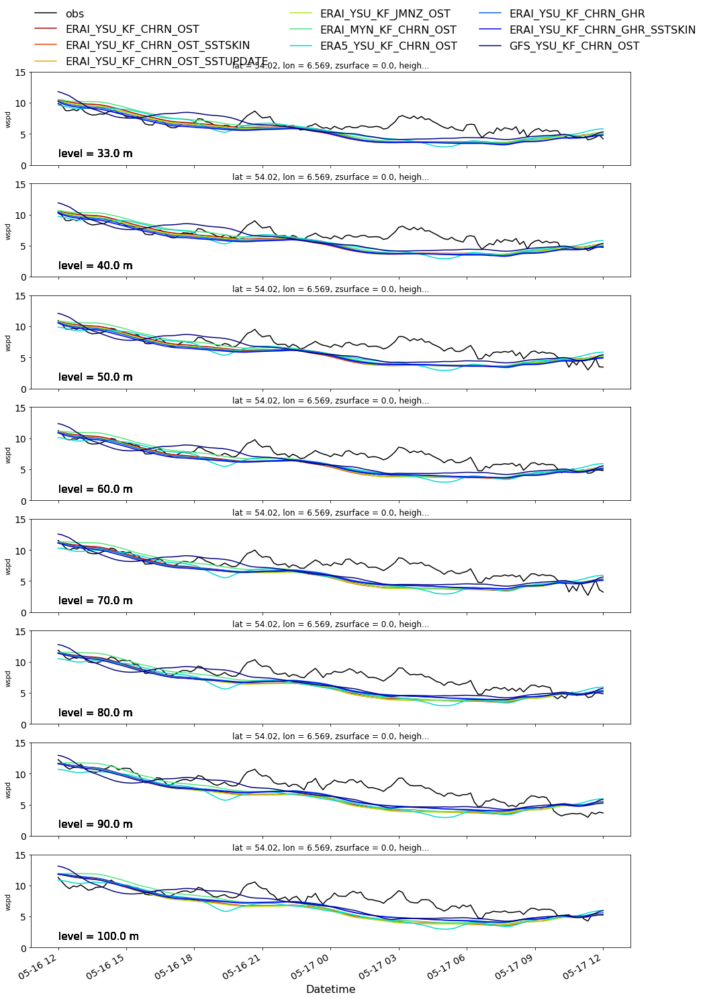

/glade/scratch/hawbecke/WRF/MMC/FINO1/20100512_to_20100526//img/TD_FINO1


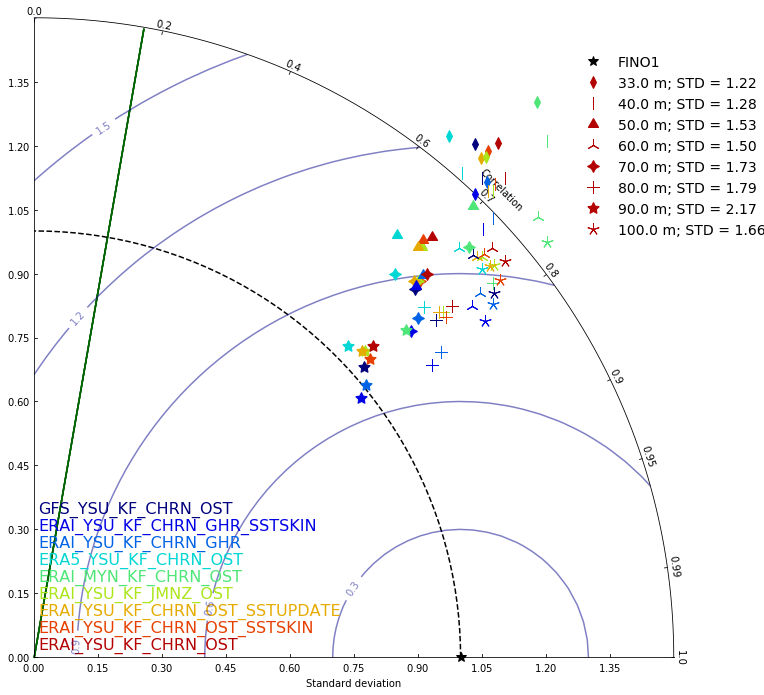

Unable to replace height 62.0 for FINO-2 due to missing data
Unable to replace height 82.0 for FINO-2 due to missing data
/glade/scratch/hawbecke/WRF/MMC/FINO1/20100512_to_20100526//img/TD_data_FINO2


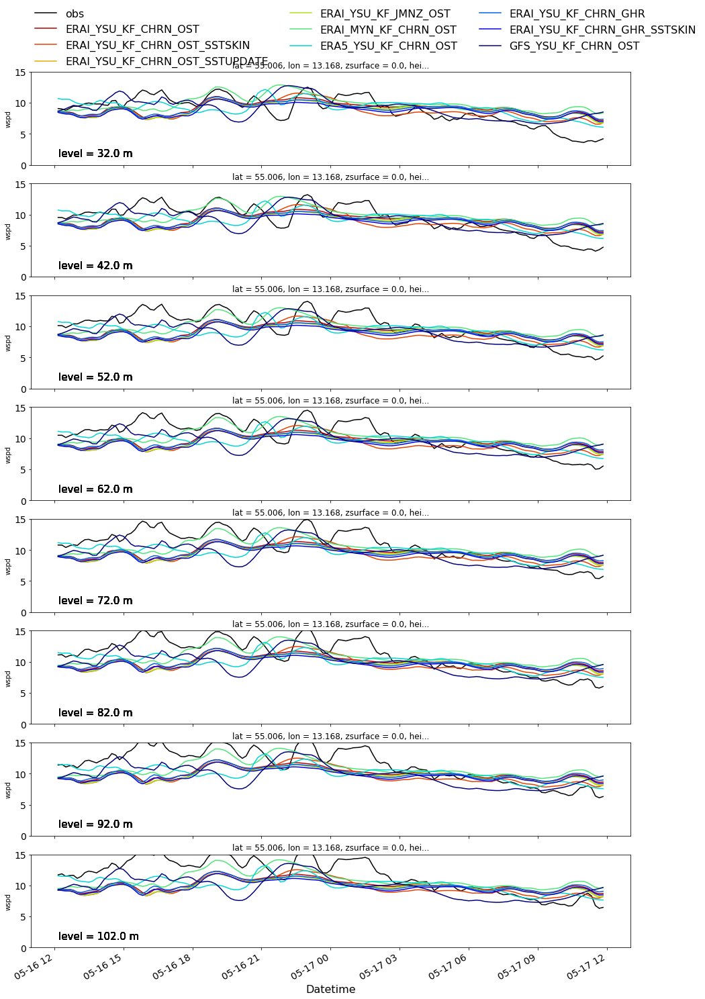

/glade/scratch/hawbecke/WRF/MMC/FINO1/20100512_to_20100526//img/TD_FINO2


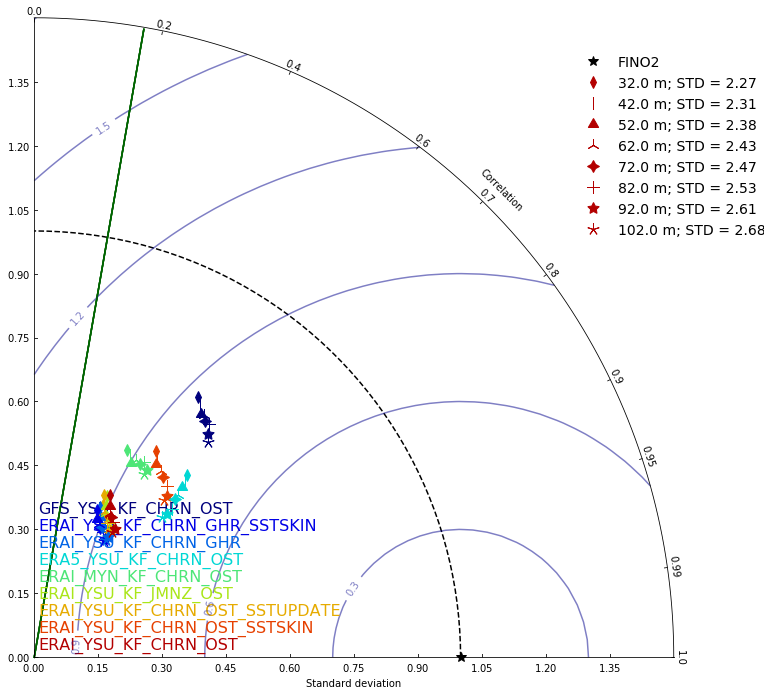

/glade/scratch/hawbecke/WRF/MMC/FINO1/20100512_to_20100526//img/TD_data_FINO3


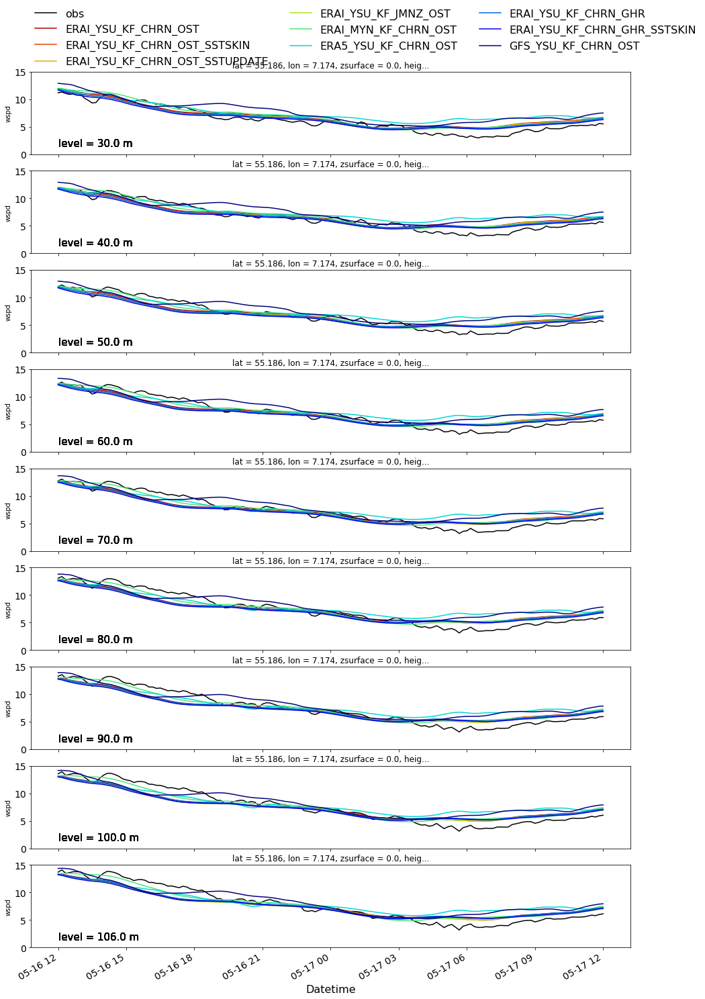

/glade/scratch/hawbecke/WRF/MMC/FINO1/20100512_to_20100526//img/TD_FINO3


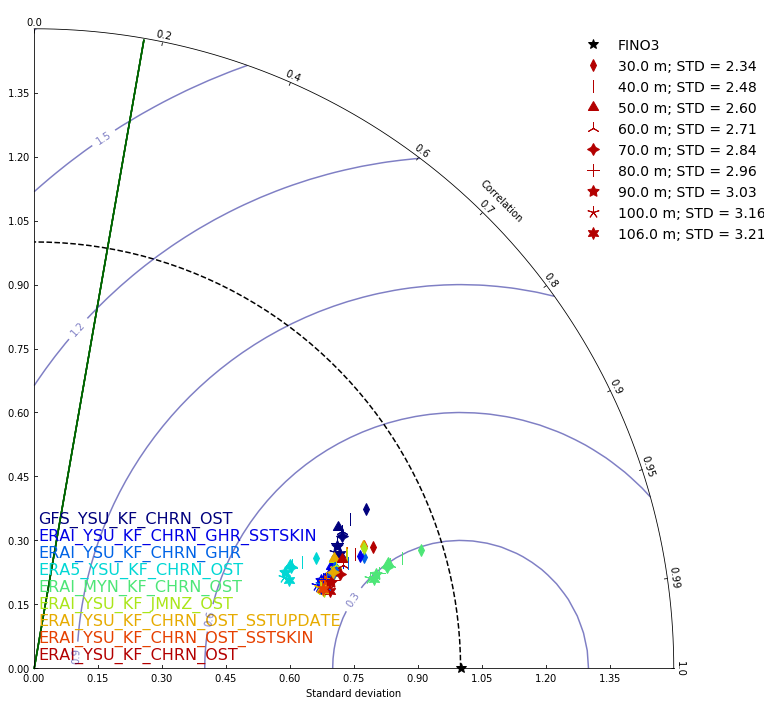

In [49]:
day_start = '2010-05-16 12:00:00'
day_end   = '2010-05-17 12:00:00'
for ff, fino in enumerate([1,2,3]):
    obs_ds = fino_obs['FINO{}'.format(fino)]
    levels = obs_ds.spd_levels.values
    obs_wdir = obs_ds.wdir
    max_pts = 0
    dir_lvl = 0
    for vv,lvl in enumerate(obs_wdir.dir_levels.values):
        dir_lvl = obs_wdir.sel(dir_levels=lvl).dropna(how='all',dim='datetime')
        num_pts = len(dir_lvl)
        if num_pts > max_pts:
            dir_lvl = lvl
    
    tay_obs_levels = [[[]]*len(levels)][0]
    ref_std_levels = np.zeros((ncases,len(levels)))
    sim_std_levels = np.zeros((ncases,len(levels)))
    sim_cor_levels = np.zeros((ncases,len(levels)))
    fig,ax = plt.subplots(nrows=len(levels),figsize=(16,24),sharex=True)
    for cc,case in enumerate(cases):
        twr_ds = wrf_twrs[case]['FN{}'.format(fino)].sel(station='FN{}'.format(fino))
        tay_wrf_levels = [[[]]*len(levels)][0]

        for vv,lvl in enumerate(levels):
            if cc == 0:
        
                
                tay_obs_levels[vv] = remove_or_replace_wake(obs_ds,lvl,start=day_start,end=day_end,remove_wake=remove_wake,
                                                            replace_wake=(replace_wake and (fino == 1 or fino == 2)),
                                                            wake_deg_bot=wake_degs['FINO{}'.format(fino)][0],
                                                            wake_deg_top=wake_degs['FINO{}'.format(fino)][1])                
                
                '''
                tay_obs_levels[vv] = obs_ds.wspd.sel(datetime=slice(day_start,day_end),spd_levels=lvl).dropna(
                                                    how='all',dim='datetime').resample(
                                                    datetime='10min').interpolate('linear')
                if remove_wake:
                    obs_wdir = obs_ds.wdir.sel(datetime=slice(day_start,day_end),dir_levels=dir_lvl).dropna(
                                                    how='all',dim='datetime').resample(datetime='10min').nearest()
                    wake_spd = tay_obs_levels[vv].copy()
                    if fino == 2:
                        wake_spd[np.where((obs_wdir.data >= wake_degs['FINO{}'.format(fino)][0]) | \
                                          (obs_wdir.data <= wake_degs['FINO{}'.format(fino)][1]))] = np.nan
                    else:
                        wake_spd[np.where((obs_wdir.data >= wake_degs['FINO{}'.format(fino)][0]) & \
                                          (obs_wdir.data <= wake_degs['FINO{}'.format(fino)][1]))] = np.nan
                    tay_obs_levels[vv] = wake_spd
                '''

            tay_wrf_levels[vv] = twr_ds.wspd.sel(datetime=slice(day_start,day_end),nz=vv).dropna(
                                                how='all',dim='datetime').resample(datetime='10min').mean()
            
            if remove_wake:
                wake_spd = tay_wrf_levels[vv].copy()
                wake_spd[np.where(np.isnan(tay_obs_levels[vv]))] = np.nan
                tay_wrf_levels[vv] = wake_spd

            obs = tay_obs_levels[vv]
            sim = tay_wrf_levels[vv]

            sim[np.where(np.isnan(obs))] = np.nan
            obs = obs.dropna(dim='datetime',how='all')
            #sim[np.where(np.isnan(obs))] = np.nan
            sim = sim.dropna(dim='datetime',how='all')

            if len(obs) != len(sim):
                sim = sim.sel(datetime=slice(obs.datetime[0],obs.datetime[-1]))
            if remove_mean:
                obs = obs - lowess_mean(obs,2016/32,0)
                sim = sim - lowess_mean(sim,2016/32,0)
            ax[vv].text(obs.datetime.data[0],1.0,'level = {} m'.format(lvl),va='bottom',size=15,ha='left')

            if cc == 0: 
                obs.resample(datetime='10min').asfreq().plot(ax=ax[vv],c='k',label='obs')
            sim.resample(datetime='10min').asfreq().plot(ax=ax[vv],c=case_colors[case],label=case)
            ax[vv].tick_params(labelsize=14)
            if vv == len(levels)-1:
                ax[vv].set_xlabel('Datetime',size=16)
            else:
                ax[vv].set_xlabel('')
            if remove_mean: ax[vv].set_ylim(-5,5)

            ref_std_levels[cc,vv] = np.std(obs.data)
            sim_std_levels[cc,vv] = np.std(sim.data)
            sim_cor_levels[cc,vv] = np.corrcoef(sim,obs)[0,1]
            ax[vv].set_ylim(0,15)
    ax[0].legend(frameon=False,loc=(0.0,1.0),ncol=3,fontsize=16)
    save_str = '{}/img/TD_data_FINO{}'.format(wrf_dir,fino)
    if remove_mean: save_str += '_pert'
    if remove_wake: save_str += '_nowake'
    print(save_str)
    if save_figs: plt.savefig('{}.png'.format(save_str))
    plt.show()
    


    fig_tay = plt.figure(figsize=(12,12))    
    dia = TaylorDiagram(1.0, fig=fig_tay, extend=False,
                            label='FINO{}'.format(fino))
    for cc,case in enumerate(cases):
        twr_dict = {}
        for a,b,c,d in zip(range(0,len(levels)),sim_std_levels[cc,:]/ref_std_levels[cc,:],
                           sim_cor_levels[cc,:],levels):
            twr_dict[a] = [b,c,'{} m'.format(d)]



        x95 = [0.0, 0.89*(np.pi/2)]
        y95 = [0.0, 1.495]

        dia.ax.plot(x95,y95,color='darkgreen',alpha=0.5)
        markers = [(i,j,0) for i in range(2,len(levels)+2) for j in range(1, 3)]

        for ii,item in enumerate(twr_dict):
            point = twr_dict[item]
            if cc == 0:
                pt_label = '{0}; STD = {1:1.2f}'.format(point[2],ref_std_levels[cc,ii])
            else:
                pt_label = None
            dia.add_sample(point[0], point[1],
                           marker=markers[item], ms=12, ls='',
                           mfc=case_colors[case], mec=case_colors[case], # Colors
                           label=pt_label,
                           zorder=4)
        plt.text(0.01,0.01+0.04*cc,case,color=case_colors[case],ha='left',va='bottom',size=16)

    contours = dia.add_contours(levels=5, colors='darkblue',alpha=0.5)
    dia.ax.clabel(contours, inline=1, fontsize=10, fmt='%.1f')
    fig_tay.legend(frameon=False,loc=(0.75,0.65),fontsize=14)
    save_str = '{}/img/TD_FINO{}'.format(wrf_dir,fino)
    if remove_mean: save_str += '_pert'
    if remove_wake: save_str += '_nowake'
    print(save_str)
    if save_figs: plt.savefig('{}.png'.format(save_str))
    plt.show()
    
    
    

# Rolling Stats:

In [50]:
period_len = 12 # hours between datapoints
nperiods = 24/period_len

period_s = pd.to_datetime(case_days_start[0])
period_e = pd.to_datetime(case_days_end[0])# - pd.to_timedelta(24,'H')
ndays = len(pd.date_range(start=period_s, end=period_e))
date_range = pd.date_range(start=period_s, end=period_e, periods=nperiods*(ndays-1)+1)
nperiods = len(date_range)

stats_dict = {'FN1': [],
              'FN2': [],
              'FN3': []}
for ff, fino in enumerate([1,2,3]):
    obs_ds = fino_obs['FINO{}'.format(fino)]
    levels = obs_ds.spd_levels.values
    obs_wdir = obs_ds.wdir
    max_pts = 0
    dir_lvl = 0
    for vv,lvl in enumerate(obs_wdir.dir_levels.values):
        dir_lvl = obs_wdir.sel(dir_levels=lvl).dropna(how='all',dim='datetime')
        num_pts = len(dir_lvl)
        if num_pts > max_pts:
            dir_lvl = lvl
    
    tay_obs_levels = [[[]]*len(levels)][0]
    ref_std_levels = np.zeros((ncases,len(levels),nperiods))
    sim_std_levels = np.zeros((ncases,len(levels),nperiods))
    sim_cor_levels = np.zeros((ncases,len(levels),nperiods))
    for cc,case in enumerate(cases):
        twr_ds = wrf_twrs[case]['FN{}'.format(fino)].sel(station='FN{}'.format(fino))
        tay_wrf_levels = [[[]]*len(levels)][0]

        for vv,lvl in enumerate(levels):

            for dd,day in enumerate(date_range):
                time_s = day - pd.to_timedelta(period_len,'H')
                #time_e = time_s + pd.to_timedelta(1,'D')
                time_e = time_s + pd.to_timedelta(24,'H')
                tay_obs_levels[vv] = remove_or_replace_wake(obs_ds,lvl,start=time_s,end=time_e,remove_wake=remove_wake,
                                                            replace_wake=(replace_wake and (fino == 1 or fino == 2)),
                                                            wake_deg_bot=wake_degs['FINO{}'.format(fino)][0],
                                                            wake_deg_top=wake_degs['FINO{}'.format(fino)][1])   
                '''
                tay_obs_levels[vv] = obs_ds.wspd.sel(datetime=slice(time_s,time_e),spd_levels=lvl).dropna(
                                                    how='all',dim='datetime').resample(datetime='10min').interpolate('linear')
                if remove_wake:
                    obs_wdir = obs_ds.wdir.sel(datetime=slice(time_s,time_e),dir_levels=dir_lvl).dropna(
                                                    how='all',dim='datetime').resample(datetime='10min').nearest()
                    wake_spd = tay_obs_levels[vv].copy()
                    if fino == 2:
                        wake_spd[np.where((obs_wdir.data >= wake_degs['FINO{}'.format(fino)][0]) | \
                                          (obs_wdir.data <= wake_degs['FINO{}'.format(fino)][1]))] = np.nan
                    else:
                        wake_spd[np.where((obs_wdir.data >= wake_degs['FINO{}'.format(fino)][0]) & \
                                          (obs_wdir.data <= wake_degs['FINO{}'.format(fino)][1]))] = np.nan
                    tay_obs_levels[vv] = wake_spd
                '''
                tay_wrf_levels[vv] = twr_ds.wspd.sel(datetime=slice(time_s,time_e),nz=vv).dropna(
                                                    how='all',dim='datetime').resample(datetime='10min').mean()


                if remove_wake:
                    wake_spd = tay_wrf_levels[vv].copy()
                    wake_spd[np.where(np.isnan(tay_obs_levels[vv]))] = np.nan
                    tay_wrf_levels[vv] = wake_spd

                obs = tay_obs_levels[vv]
                sim = tay_wrf_levels[vv]
                
                sim[np.where(np.isnan(obs))] = np.nan
                obs = obs.dropna(dim='datetime',how='all')
                sim = sim.dropna(dim='datetime',how='all')

                if len(obs) != len(sim):
                    sim = sim.sel(datetime=slice(obs.datetime[0],obs.datetime[-1]))
                    
                if remove_mean:
                    obs = obs - lowess_mean(obs,2016/32,0)
                    sim = sim - lowess_mean(sim,2016/32,0)

                if remove_mean: ax[vv].set_ylim(-5,5)
                ref_std_levels[cc,vv,dd] = np.std(obs.data)
                sim_std_levels[cc,vv,dd] = np.std(sim.data)
                sim_cor_levels[cc,vv,dd] = np.corrcoef(sim,obs)[0,1]
              
    stats_dict['FN{}'.format(fino)] = {'ref_std': ref_std_levels,
                                       'sim_std': sim_std_levels,
                                       'sim_cor': sim_cor_levels}

    



Unable to replace height 62.0 for FINO-2 due to missing data
Unable to replace height 62.0 for FINO-2 due to missing data
Unable to replace height 62.0 for FINO-2 due to missing data
Unable to replace height 62.0 for FINO-2 due to missing data
Unable to replace height 62.0 for FINO-2 due to missing data
Unable to replace height 62.0 for FINO-2 due to missing data
Unable to replace height 62.0 for FINO-2 due to missing data
Unable to replace height 62.0 for FINO-2 due to missing data
Unable to replace height 62.0 for FINO-2 due to missing data
Unable to replace height 62.0 for FINO-2 due to missing data
Unable to replace height 62.0 for FINO-2 due to missing data
Unable to replace height 62.0 for FINO-2 due to missing data
Unable to replace height 62.0 for FINO-2 due to missing data
Unable to replace height 62.0 for FINO-2 due to missing data
Unable to replace height 62.0 for FINO-2 due to missing data
Unable to replace height 62.0 for FINO-2 due to missing data
Unable to replace height

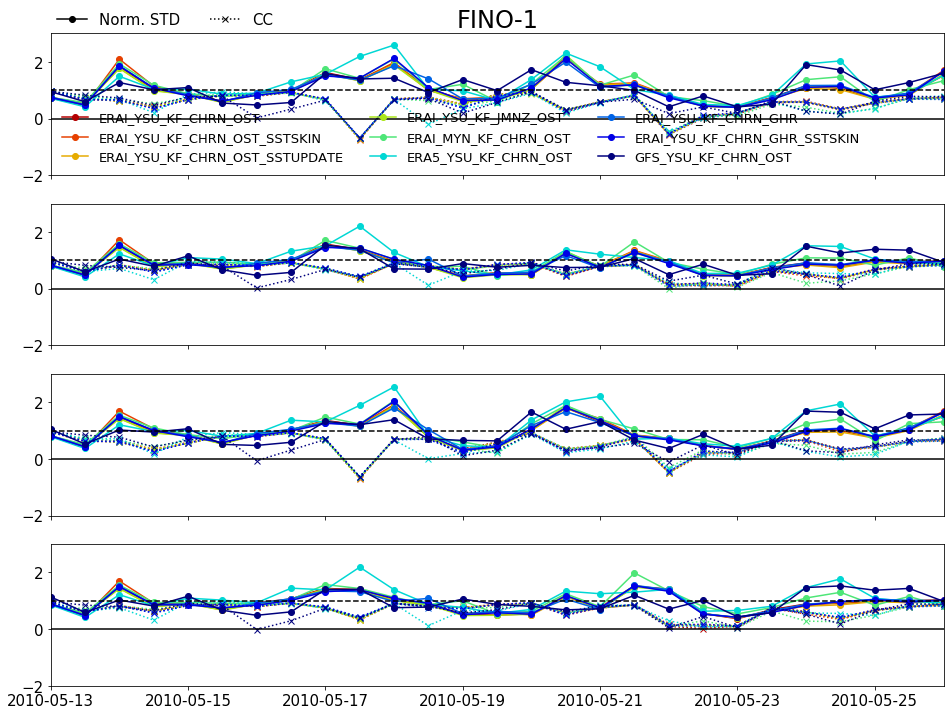

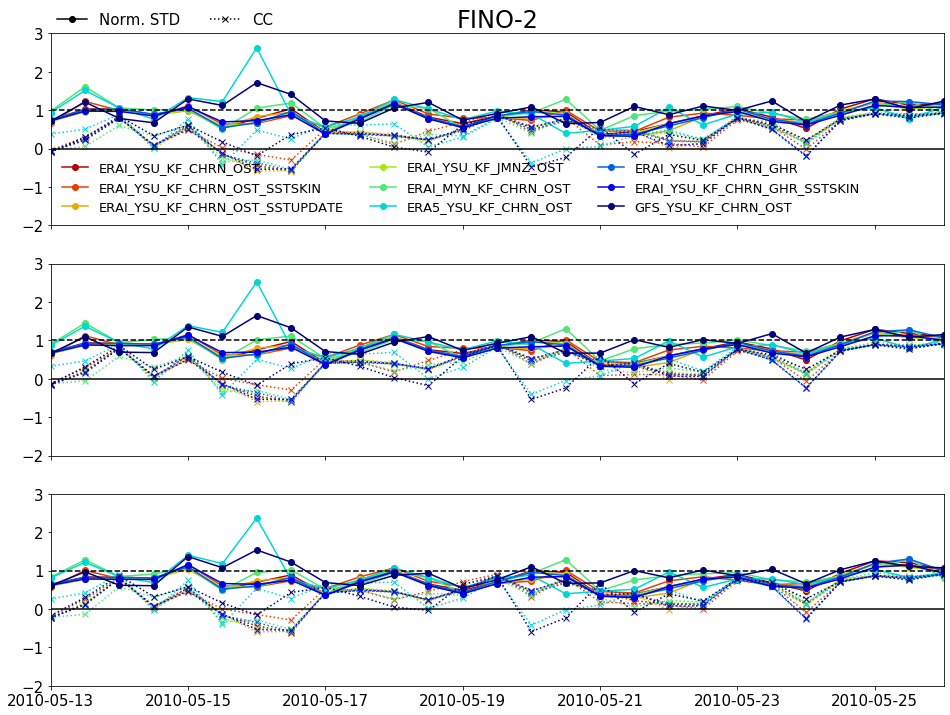

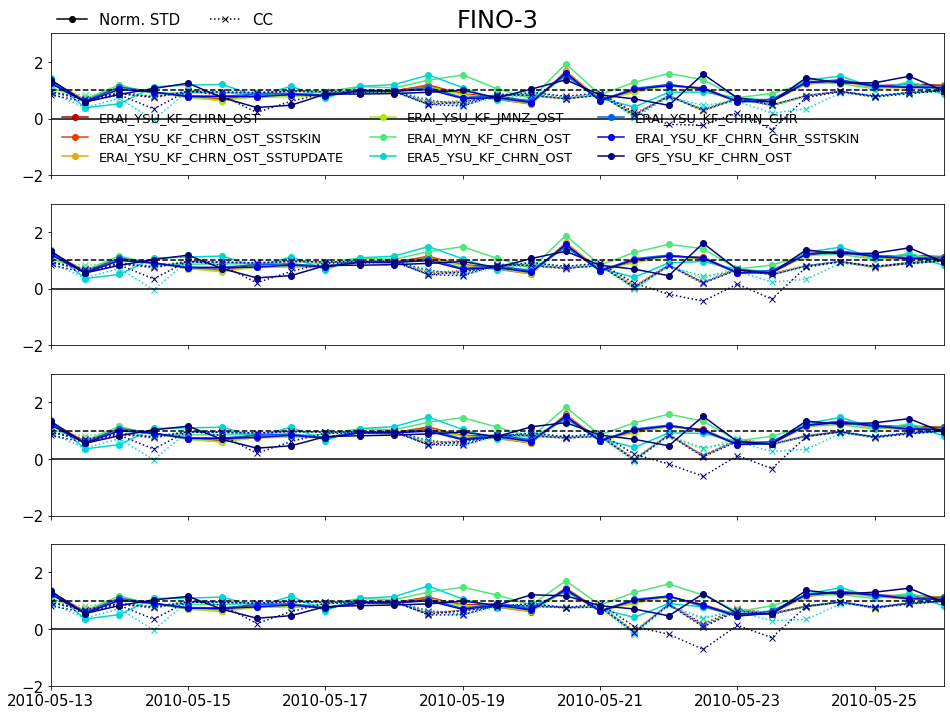

In [53]:
for ff, fino in enumerate([1,2,3]):
    fino_stats = stats_dict['FN{}'.format(fino)]    
    reg_std_levels = fino_stats['sim_std']/fino_stats['ref_std']
    reg_cor_levels = fino_stats['sim_cor']
    levels_of_interest = levels[[0,round(len(levels)/2),-1]]
    if fino == 2:
        levels_of_interest = [42., 62., 82.,]
    else:
        levels_of_interest = [40., 60., 80., 100.]
    fig,ax = plt.subplots(nrows=len(levels_of_interest),figsize=(16,12),sharex=True)
    for vv,lvl in enumerate(levels_of_interest):
        for cc,case in enumerate(cases):
            ax[vv].plot(date_range,reg_std_levels[cc,vv,:],c=case_colors[case],label=case,marker='o')
            ax[vv].plot(date_range,reg_cor_levels[cc,vv,:],c=case_colors[case],marker='x',ls=':')
        ax[vv].set_ylim(-2,3)
        ax[vv].tick_params(labelsize=15)
        ax[vv].axhline(1.0,c='k',ls='--')
        ax[vv].axhline(0.0,c='k',ls='-')
    ax[0].set_title('FINO-{}'.format(fino),size=24)
    ax[0].legend(frameon=False,fontsize=13,ncol=3,loc=3)
    ax[0].set_xlim(date_range[0],date_range[-1])
    
    
    
    std_line = mlines.Line2D([], [], color='k', marker='o', ls='-',label='Norm. STD')
    cor_line = mlines.Line2D([], [], color='k', marker='x', ls=':',label='CC')
    ax[1].legend(handles=[std_line,cor_line],frameon=False,fontsize=15,loc=[0.0,2.2],ncol=2)
    plt.show()
    print('\n')

/glade/u/home/hawbecke/local/envs/mmc/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in true_divide
  This is separate from the ipykernel package so we can avoid doing imports until


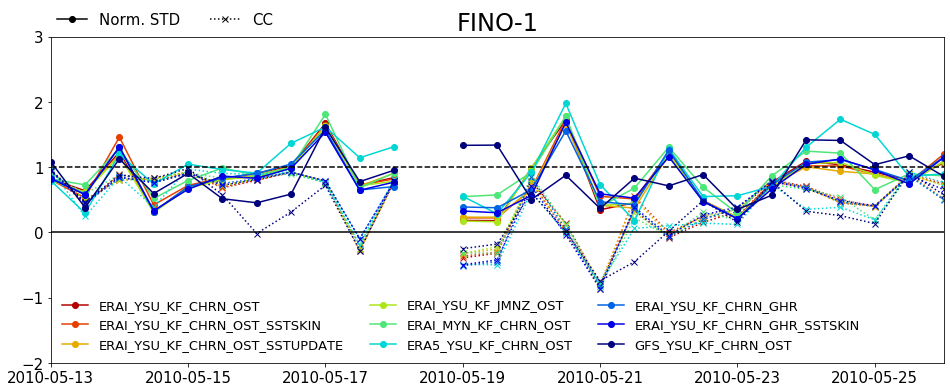

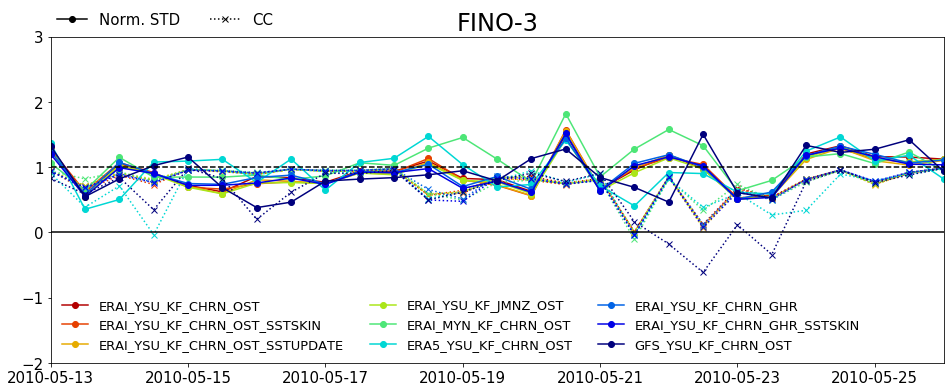

In [55]:
for ff, fino in enumerate([1,3]):
    fino_stats = stats_dict['FN{}'.format(fino)]    
    reg_std_levels = fino_stats['sim_std']/fino_stats['ref_std']
    reg_cor_levels = fino_stats['sim_cor']
    levels_of_interest = levels[round(len(levels)/2)]
    fig,ax = plt.subplots(figsize=(16,6),sharex=True)
    for cc,case in enumerate(cases):
        ax.plot(date_range,reg_std_levels[cc,vv,:],c=case_colors[case],label=case,marker='o')
        ax.plot(date_range,reg_cor_levels[cc,vv,:],c=case_colors[case],marker='x',ls=':')
    ax.set_ylim(-2,3)
    ax.tick_params(labelsize=15)
    ax.axhline(1.0,c='k',ls='--')
    ax.axhline(0.0,c='k',ls='-')
    ax.set_title('FINO-{}'.format(fino),size=24)
    sim_leg = ax.legend(frameon=False,fontsize=13,ncol=3,loc=3)
    ax.set_xlim(date_range[0],date_range[-1])
    
    
    
    mlines.Line2D([], [], color='k', marker='o', ls='-',label='Norm. STD')
    cor_line = mlines.Line2D([], [], color='k', marker='x', ls=':',label='CC')
    dat_leg = ax.legend(handles=[std_line,cor_line],frameon=False,fontsize=15,loc=[0.0,1.01],ncol=2)
    plt.gca().add_artist(sim_leg)
    plt.show()
    print('\n')

# WRFOUT Comparison

In [54]:
wrfout_f_dict = {}
for cc,case in enumerate(cases):
    wrfout_f_dict[case] = sorted(glob.glob('{}{}/{}/wrfout_d03*'.format(wrf_dir,cases[cc],restarts[1])))

In [55]:
base_full = wrfout_f_dict['ERAI_YSU_KF_CHRN_OST']
ghrs_full = wrfout_f_dict['ERAI_YSU_KF_CHRN_GHR']
gskn_full = wrfout_f_dict['ERAI_YSU_KF_CHRN_GHR_SSTSKIN']
jmnz_full = wrfout_f_dict['ERAI_YSU_KF_JMNZ_OST']
skin_full = wrfout_f_dict['ERAI_YSU_KF_CHRN_OST_SSTSKIN']
updt_full = wrfout_f_dict['ERAI_YSU_KF_CHRN_OST_SSTUPDATE']

time_of_interest = '2010-05-15_12:00:00'

for f in base_full:
    if time_of_interest in f:
        print(f)
        base_f = f
for f in ghrs_full:
    if time_of_interest in f:
        print(f)
        ghrs_f = f
for f in gskn_full:
    if time_of_interest in f:
        print(f)
        gskn_f = f
for f in jmnz_full:
    if time_of_interest in f:
        print(f)
        jmnz_f = f
for f in skin_full:
    if time_of_interest in f:
        print(f)
        skin_f = f
for f in updt_full:
    if time_of_interest in f:
        print(f)
        updt_f = f

/glade/scratch/hawbecke/WRF/MMC/FINO1/20100512_to_20100526/ERAI_YSU_KF_CHRN_OST/FINO_2010051412/wrfout_d03_2010-05-15_12:00:00
/glade/scratch/hawbecke/WRF/MMC/FINO1/20100512_to_20100526/ERAI_YSU_KF_CHRN_GHR/FINO_2010051412/wrfout_d03_2010-05-15_12:00:00
/glade/scratch/hawbecke/WRF/MMC/FINO1/20100512_to_20100526/ERAI_YSU_KF_CHRN_GHR_SSTSKIN/FINO_2010051412/wrfout_d03_2010-05-15_12:00:00
/glade/scratch/hawbecke/WRF/MMC/FINO1/20100512_to_20100526/ERAI_YSU_KF_JMNZ_OST/FINO_2010051412/wrfout_d03_2010-05-15_12:00:00
/glade/scratch/hawbecke/WRF/MMC/FINO1/20100512_to_20100526/ERAI_YSU_KF_CHRN_OST_SSTSKIN/FINO_2010051412/wrfout_d03_2010-05-15_12:00:00
/glade/scratch/hawbecke/WRF/MMC/FINO1/20100512_to_20100526/ERAI_YSU_KF_CHRN_OST_SSTUPDATE/FINO_2010051412/wrfout_d03_2010-05-15_12:00:00


In [56]:
fino_markerc = ['coral','forestgreen','royalblue']

In [57]:
base_out = ncdf(base_f)
ghrs_out = ncdf(ghrs_f)
gskn_out = ncdf(gskn_f)
jmnz_out = ncdf(jmnz_f)
skin_out = ncdf(skin_f)
updt_out = ncdf(updt_f)

In [59]:
landmask = jmnz_out.variables['LANDMASK'][0,:,:]
lon = base_out.variables['XLONG'][0,:,:]
lat = base_out.variables['XLAT'][0,:,:]

border = landmask*0.0
border[0,:] = border[0,:]+1.0
border[-1,:] = border[-1,:]+1.0
border[:,0] = border[:,0]+1.0
border[:,-1] = border[:,-1]+1.0

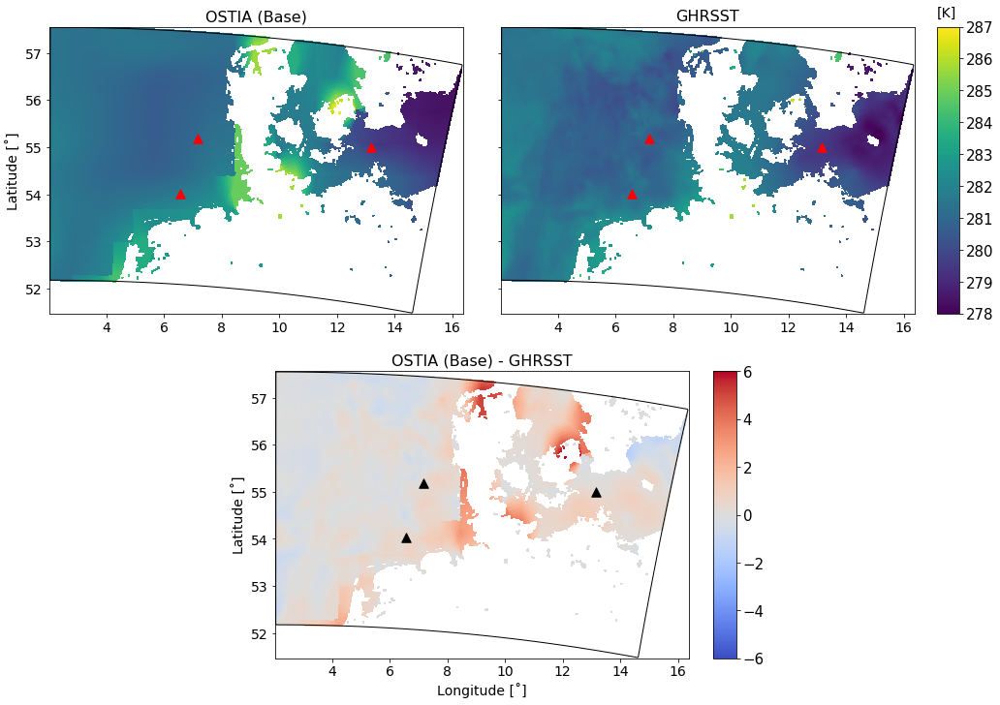

In [60]:
base_sst = base_out.variables['TSK'][0,:,:]
base_sst[landmask>0] = np.nan
ghrs_sst = ghrs_out.variables['TSK'][0,:,:]
ghrs_sst[landmask>0] = np.nan

fig = plt.figure(figsize=(16,12))
plt.subplot2grid((2,4),(0,0),colspan=2)
baseplt = plt.pcolormesh(lon,lat,base_sst,norm=Normalize(278,287))
#plt.contour(lon,lat,landmask,colors='k',levels=[0.5])
plt.contour(lon,lat,border,colors='k',levels=[0.5],linewidths=1.0)
for ff,fino in enumerate([1,2,3]):
    plt.scatter(wrf_twrs[case]['FN{}'.format(fino)].lon.data[0],
                wrf_twrs[case]['FN{}'.format(fino)].lat.data[0],
                marker='^',zorder=3,color='r',s=90)
plt.title('OSTIA (Base)',size=16)
plt.tick_params(labelsize=14)
plt.ylabel('Latitude [˚]',size=14)

plt.subplot2grid((2,4),(0,2),colspan=2)
ghrsplt = plt.pcolormesh(lon,lat,ghrs_sst,norm=Normalize(278,287))
plt.contour(lon,lat,border,colors='k',levels=[0.5],linewidths=1.0)
for ff,fino in enumerate([1,2,3]):
    plt.scatter(wrf_twrs[case]['FN{}'.format(fino)].lon.data[0],
                wrf_twrs[case]['FN{}'.format(fino)].lat.data[0],
                marker='^',zorder=3,color='r',s=90)
plt.title('GHRSST',size=16)
plt.tick_params(labelsize=14,labelleft=False)

plt.subplot2grid((2,4),(1,1),colspan=2)
diffplt = plt.pcolormesh(lon,lat,base_sst-ghrs_sst,cmap=plt.cm.coolwarm,norm=Normalize(-6,6))
plt.contour(lon,lat,border,colors='k',levels=[0.5],linewidths=1.0)
for ff,fino in enumerate([1,2,3]):
    plt.scatter(wrf_twrs[case]['FN{}'.format(fino)].lon.data[0],
                wrf_twrs[case]['FN{}'.format(fino)].lat.data[0],
                marker='^',zorder=3,color='k',s=90)
plt.title('OSTIA (Base) - GHRSST',size=16)
plt.tick_params(labelsize=14)
plt.xlabel('Longitude [˚]',size=14)
plt.ylabel('Latitude [˚]',size=14)


sst_ax   = fig.add_axes([0.92, 0.537, 0.02, 0.343])
sst_cbar = fig.colorbar(baseplt, cax=sst_ax)
sst_ax.text(278.0,287.3,'[K]',size=14)
sst_ax.tick_params(labelsize=15)

dif_ax   = fig.add_axes([0.72, 0.125, 0.02, 0.343])
dif_cbar = fig.colorbar(diffplt, cax=dif_ax)
dif_ax.tick_params(labelsize=15)

plt.show()

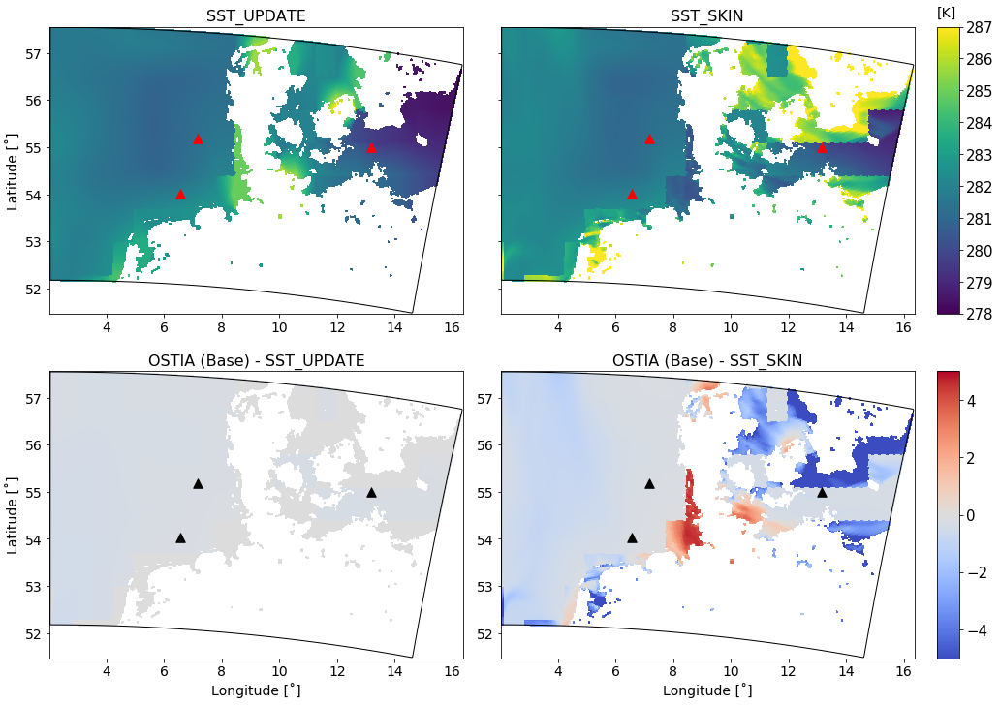

In [61]:
updt_sst = updt_out.variables['TSK'][0,:,:]
updt_sst[landmask>0] = np.nan
skin_sst = skin_out.variables['TSK'][0,:,:]
skin_sst[landmask>0] = np.nan
minT,maxT = 278,287
diffT = 5

fig = plt.figure(figsize=(16,12))
plt.subplot2grid((2,4),(0,0),colspan=2)
baseplt = plt.pcolormesh(lon,lat,updt_sst,norm=Normalize(minT,maxT))
#plt.contour(lon,lat,landmask,colors='k',levels=[0.5])
plt.contour(lon,lat,border,colors='k',levels=[0.5],linewidths=1.0)
for ff,fino in enumerate([1,2,3]):
    plt.scatter(wrf_twrs[case]['FN{}'.format(fino)].lon.data[0],
                wrf_twrs[case]['FN{}'.format(fino)].lat.data[0],
                marker='^',zorder=3,color='r',s=90)
plt.title('SST_UPDATE',size=16)
plt.tick_params(labelsize=14)
plt.ylabel('Latitude [˚]',size=14)

plt.subplot2grid((2,4),(0,2),colspan=2)
ghrsplt = plt.pcolormesh(lon,lat,skin_sst,norm=Normalize(minT,maxT))
plt.contour(lon,lat,border,colors='k',levels=[0.5],linewidths=1.0)
for ff,fino in enumerate([1,2,3]):
    plt.scatter(wrf_twrs[case]['FN{}'.format(fino)].lon.data[0],
                wrf_twrs[case]['FN{}'.format(fino)].lat.data[0],
                marker='^',zorder=3,color='r',s=90)
plt.title('SST_SKIN',size=16)
plt.tick_params(labelsize=14,labelleft=False)

plt.subplot2grid((2,4),(1,0),colspan=2)
diffplt = plt.pcolormesh(lon,lat,base_sst-updt_sst,cmap=plt.cm.coolwarm,norm=Normalize(-diffT,diffT))
plt.contour(lon,lat,border,colors='k',levels=[0.5],linewidths=1.0)
for ff,fino in enumerate([1,2,3]):
    plt.scatter(wrf_twrs[case]['FN{}'.format(fino)].lon.data[0],
                wrf_twrs[case]['FN{}'.format(fino)].lat.data[0],
                marker='^',zorder=3,color='k',s=90)
plt.title('OSTIA (Base) - SST_UPDATE',size=16)
plt.tick_params(labelsize=14)
plt.xlabel('Longitude [˚]',size=14)
plt.ylabel('Latitude [˚]',size=14)


plt.subplot2grid((2,4),(1,2),colspan=2)
diffplt = plt.pcolormesh(lon,lat,base_sst-skin_sst,cmap=plt.cm.coolwarm,norm=Normalize(-diffT,diffT))
plt.contour(lon,lat,border,colors='k',levels=[0.5],linewidths=1.0)
for ff,fino in enumerate([1,2,3]):
    plt.scatter(wrf_twrs[case]['FN{}'.format(fino)].lon.data[0],
                wrf_twrs[case]['FN{}'.format(fino)].lat.data[0],
                marker='^',zorder=3,color='k',s=90)
plt.title('OSTIA (Base) - SST_SKIN',size=16)
plt.tick_params(labelsize=14)
plt.xlabel('Longitude [˚]',size=14)
#plt.ylabel('Latitude [˚]',size=14)


sst_ax   = fig.add_axes([0.92, 0.537, 0.02, 0.343])
sst_cbar = fig.colorbar(baseplt, cax=sst_ax)
sst_ax.text(278.0,287.3,'[K]',size=14)
sst_ax.tick_params(labelsize=15)

dif_ax   = fig.add_axes([0.92, 0.125, 0.02, 0.343])
dif_cbar = fig.colorbar(diffplt, cax=dif_ax)
dif_ax.tick_params(labelsize=15)

plt.show()

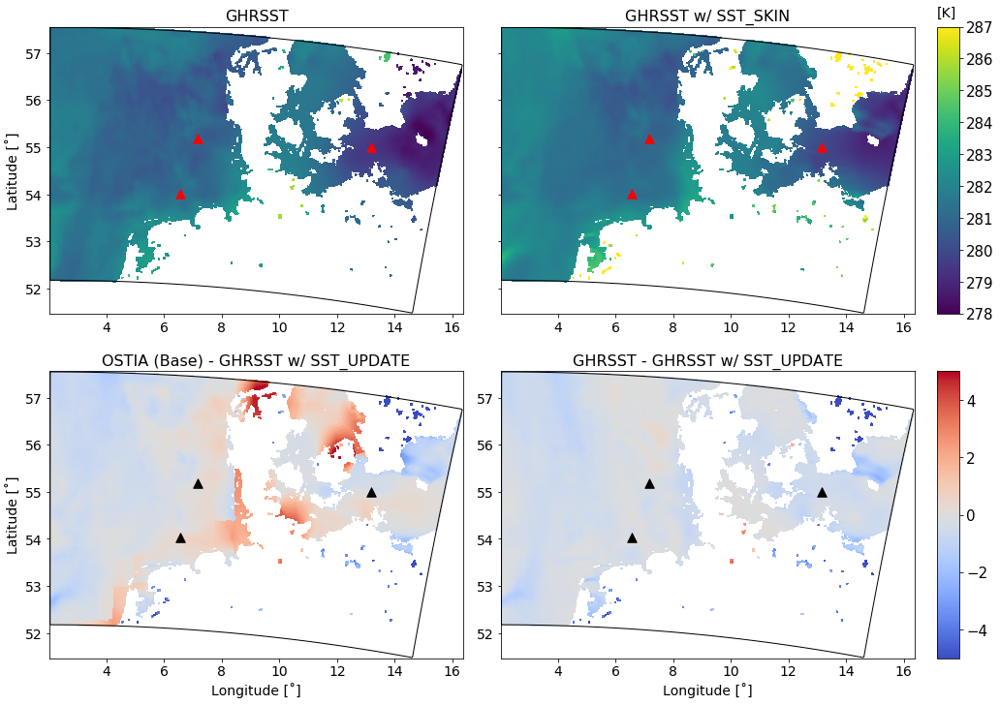

In [64]:
ghrs_sst = ghrs_out.variables['TSK'][0,:,:]
ghrs_sst[landmask>0] = np.nan
gskn_sst = gskn_out.variables['TSK'][0,:,:]
gskn_sst[landmask>0] = np.nan
minT,maxT = 278,287
diffT = 5

fig = plt.figure(figsize=(16,12))
plt.subplot2grid((2,4),(0,0),colspan=2)
baseplt = plt.pcolormesh(lon,lat,ghrs_sst,norm=Normalize(minT,maxT))
#plt.contour(lon,lat,landmask,colors='k',levels=[0.5])
plt.contour(lon,lat,border,colors='k',levels=[0.5],linewidths=1.0)
for ff,fino in enumerate([1,2,3]):
    plt.scatter(wrf_twrs[case]['FN{}'.format(fino)].lon.data[0],
                wrf_twrs[case]['FN{}'.format(fino)].lat.data[0],
                marker='^',zorder=3,color='r',s=90)
plt.title('GHRSST',size=16)
plt.tick_params(labelsize=14)
plt.ylabel('Latitude [˚]',size=14)

plt.subplot2grid((2,4),(0,2),colspan=2)
ghrsplt = plt.pcolormesh(lon,lat,gskn_sst,norm=Normalize(minT,maxT))
plt.contour(lon,lat,border,colors='k',levels=[0.5],linewidths=1.0)
for ff,fino in enumerate([1,2,3]):
    plt.scatter(wrf_twrs[case]['FN{}'.format(fino)].lon.data[0],
                wrf_twrs[case]['FN{}'.format(fino)].lat.data[0],
                marker='^',zorder=3,color='r',s=90)
plt.title('GHRSST w/ SST_SKIN',size=16)
plt.tick_params(labelsize=14,labelleft=False)

plt.subplot2grid((2,4),(1,0),colspan=2)
diffplt = plt.pcolormesh(lon,lat,base_sst-gskn_sst,cmap=plt.cm.coolwarm,norm=Normalize(-diffT,diffT))
plt.contour(lon,lat,border,colors='k',levels=[0.5],linewidths=1.0)
for ff,fino in enumerate([1,2,3]):
    plt.scatter(wrf_twrs[case]['FN{}'.format(fino)].lon.data[0],
                wrf_twrs[case]['FN{}'.format(fino)].lat.data[0],
                marker='^',zorder=3,color='k',s=90)
plt.title('OSTIA (Base) - GHRSST w/ SST_UPDATE',size=16)
plt.tick_params(labelsize=14)
plt.xlabel('Longitude [˚]',size=14)
plt.ylabel('Latitude [˚]',size=14)


plt.subplot2grid((2,4),(1,2),colspan=2)
diffplt = plt.pcolormesh(lon,lat,ghrs_sst-gskn_sst,cmap=plt.cm.coolwarm,norm=Normalize(-diffT,diffT))
plt.contour(lon,lat,border,colors='k',levels=[0.5],linewidths=1.0)
for ff,fino in enumerate([1,2,3]):
    plt.scatter(wrf_twrs[case]['FN{}'.format(fino)].lon.data[0],
                wrf_twrs[case]['FN{}'.format(fino)].lat.data[0],
                marker='^',zorder=3,color='k',s=90)
plt.title('GHRSST - GHRSST w/ SST_UPDATE',size=16)
plt.tick_params(labelsize=14)
plt.xlabel('Longitude [˚]',size=14)
#plt.ylabel('Latitude [˚]',size=14)


sst_ax   = fig.add_axes([0.92, 0.537, 0.02, 0.343])
sst_cbar = fig.colorbar(baseplt, cax=sst_ax)
sst_ax.text(278.0,287.3,'[K]',size=14)
sst_ax.tick_params(labelsize=15)

dif_ax   = fig.add_axes([0.92, 0.125, 0.02, 0.343])
dif_cbar = fig.colorbar(diffplt, cax=dif_ax)
dif_ax.tick_params(labelsize=15)

plt.show()

In [77]:
print(np.nanmin(base_znt),np.nanmax(base_znt))
print(np.nanmin(jmnz_znt),np.nanmax(jmnz_znt))

3.2603046e-05 0.00094593083
2.6688427e-05 0.00285


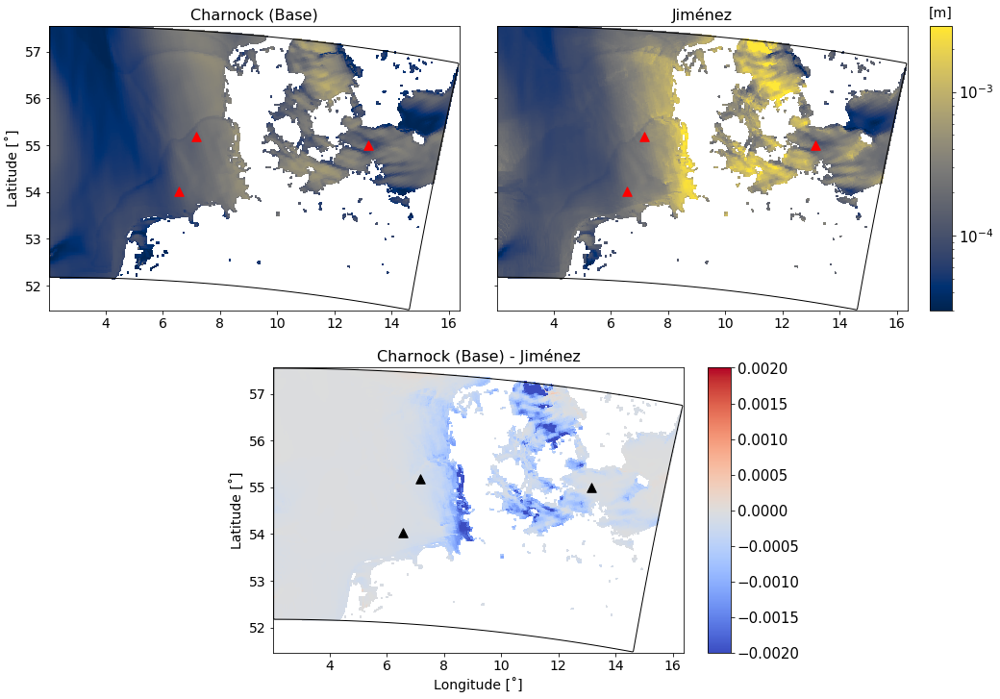

In [42]:
base_znt = base_out.variables['ZNT'][0,:,:]
base_znt[landmask>0] = np.nan
jmnz_znt = jmnz_out.variables['ZNT'][0,:,:]
jmnz_znt[landmask>0] = np.nan

fig = plt.figure(figsize=(16,12))
plt.subplot2grid((2,4),(0,0),colspan=2)
baseplt = plt.pcolormesh(lon,lat,base_znt,norm=colors.LogNorm(3e-5,2.9e-3),cmap=plt.cm.cividis)
#plt.contour(lon,lat,landmask,colors='k',levels=[0.5])
plt.contour(lon,lat,border,colors='k',levels=[0.5],linewidths=1.0)
for ff,fino in enumerate([1,2,3]):
    plt.scatter(wrf_twrs[case]['FN{}'.format(fino)].lon.data[0],
                wrf_twrs[case]['FN{}'.format(fino)].lat.data[0],
                marker='^',zorder=3,color='r',s=90)
plt.title('Charnock (Base)',size=16)
plt.tick_params(labelsize=14)
plt.ylabel('Latitude [˚]',size=14)

plt.subplot2grid((2,4),(0,2),colspan=2)
jmnzplt = plt.pcolormesh(lon,lat,jmnz_znt,norm=colors.LogNorm(3e-5,2.9e-3),cmap=plt.cm.cividis)
plt.contour(lon,lat,border,colors='k',levels=[0.5],linewidths=1.0)
for ff,fino in enumerate([1,2,3]):
    plt.scatter(wrf_twrs[case]['FN{}'.format(fino)].lon.data[0],
                wrf_twrs[case]['FN{}'.format(fino)].lat.data[0],
                marker='^',zorder=3,color='r',s=90)
plt.title('Jiménez',size=16)
plt.tick_params(labelsize=14,labelleft=False)

plt.subplot2grid((2,4),(1,1),colspan=2)
diffplt = plt.pcolormesh(lon,lat,base_znt-jmnz_znt,cmap=plt.cm.coolwarm,norm=Normalize(-2e-3,2e-3))
plt.contour(lon,lat,border,colors='k',levels=[0.5],linewidths=1.0)
for ff,fino in enumerate([1,2,3]):
    plt.scatter(wrf_twrs[case]['FN{}'.format(fino)].lon.data[0],
                wrf_twrs[case]['FN{}'.format(fino)].lat.data[0],
                marker='^',zorder=3,color='k',s=90)
plt.title('Charnock (Base) - Jiménez',size=16)
plt.tick_params(labelsize=14)
plt.xlabel('Longitude [˚]',size=14)
plt.ylabel('Latitude [˚]',size=14)

sst_ax   = fig.add_axes([0.92, 0.537, 0.02, 0.343])
sst_cbar = fig.colorbar(baseplt, cax=sst_ax)
sst_ax.text(2.5e-5,3.3e-3,'[m]',size=14)
sst_ax.tick_params(labelsize=15)

dif_ax   = fig.add_axes([0.72, 0.125, 0.02, 0.343])
dif_cbar = fig.colorbar(diffplt, cax=dif_ax)
dif_ax.tick_params(labelsize=15)

plt.show()

# Observation correlation:

In [81]:
fn1_obs = fino_obs['FINO1'].wspd.sel(spd_levels=33.0).resample(datetime='10min').nearest()
fn2_obs = fino_obs['FINO2'].wspd.sel(spd_levels=32.0).resample(datetime='10min').nearest()
fn3_obs = fino_obs['FINO3'].wspd.sel(spd_levels=30.0).resample(datetime='10min').nearest()

fn1_obs = fn1_obs.sel(datetime=slice(fn1_obs.datetime.data[0],fn1_obs.datetime.data[-2]))
fn3_obs = fn3_obs.sel(datetime=slice(fn3_obs.datetime.data[0],fn3_obs.datetime.data[-2]))

In [83]:
fn1_obs.data[np.where(np.isnan(fn2_obs.data))] = np.nan
fn2_obs.data[np.where(np.isnan(fn1_obs.data))] = np.nan
fn3_obs.data[np.where(np.isnan(fn1_obs.data))] = np.nan
fn1_obs.data[np.where(np.isnan(fn3_obs.data))] = np.nan
fn2_obs.data[np.where(np.isnan(fn1_obs.data))] = np.nan

In [84]:
fn1_obs = fn1_obs.dropna(how='any',dim='datetime')
fn2_obs = fn2_obs.dropna(how='any',dim='datetime')
fn3_obs = fn3_obs.dropna(how='any',dim='datetime')

In [110]:
f1_f2, f12_xedges, f12_yedges = np.histogram2d(fn1_obs.data, fn2_obs.data, bins=50)
f12extent = [f12_xedges[0], f12_xedges[-1], f12_xedges[0], f12_xedges[-1]]

f1_f3, f13_xedges, f13_yedges = np.histogram2d(fn1_obs.data, fn3_obs.data, bins=50)
f13extent = [f13_xedges[0], f13_xedges[-1], f13_xedges[0], f13_xedges[-1]]

f2_f3, f23_xedges, f23_yedges = np.histogram2d(fn2_obs.data, fn3_obs.data, bins=50)
f23extent = [f23_xedges[0], f23_xedges[-1], f23_xedges[0], f13_xedges[-1]]

f12_x, f12_y = np.meshgrid(f12_xedges,f12_yedges)
f13_x, f13_y = np.meshgrid(f13_xedges,f13_yedges)
f23_x, f23_y = np.meshgrid(f23_xedges,f23_yedges)

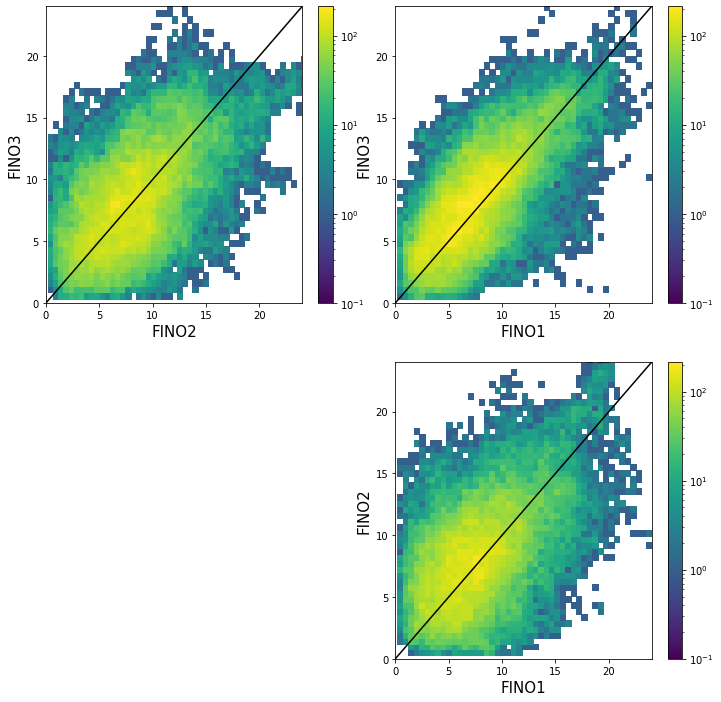

In [121]:
plt.figure(figsize=(12,12))
fig1 = plt.subplot2grid((2,4),(0,0),colspan=2)
plt.pcolormesh(f23_x, f23_y, f2_f3.T,norm=colors.LogNorm(vmin=1e-1,vmax=f1_f3.max()))
plt.plot([0,25],[0,25],c='k')
plt.colorbar()
plt.ylabel('FINO3',size=15)
plt.xlabel('FINO2',size=15)


fig2 = plt.subplot2grid((2,4),(0,2),colspan=2,sharey=fig1,sharex=fig1)
plt.pcolormesh(f13_x, f13_y, f1_f3.T,norm=colors.LogNorm(vmin=1e-1,vmax=f1_f3.max()))
plt.plot([0,25],[0,25],c='k')
plt.colorbar()
plt.ylabel('FINO3',size=15)
plt.xlabel('FINO1',size=15)

fig3 = plt.subplot2grid((2,4),(1,2),colspan=2,sharey=fig1,sharex=fig1)
plt.pcolormesh(f12_x, f12_y, f1_f2.T,norm=colors.LogNorm(vmin=1e-1,vmax=f1_f3.max()))
plt.colorbar()
plt.plot([0,25],[0,25],c='k')
plt.ylabel('FINO2',size=15)
plt.xlabel('FINO1',size=15)
plt.ylim(0,24)
plt.xlim(0,24)

plt.show()